<a href="https://colab.research.google.com/github/kundajelab/adar_editing/blob/master/xgboost_with_shap/XGBOOST_WITH_TREESHAP-Neil1-by_Xin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install numpy==1.15


In [0]:
!pip install shap
!pip install --upgrade xgboost
!pip install cufflinks

In [0]:
# Fix the issue of using "plotnine"
!pip install statsmodels -U
!pip install plotnine

In [4]:
## Uncomment these lines if running as a google colab notebook: 
import shutil
import os

shutil.rmtree(os.path.join(os.getcwd(), "adar_editing"))
!git clone https://github.com/kundajelab/adar_editing

Cloning into 'adar_editing'...
remote: Enumerating objects: 167, done.
remote: Counting objects: 100% (167/167), done.
remote: Compressing objects: 100% (119/119), done.
remote: Total 530 (delta 116), reused 81 (delta 48), pack-reused 363
Receiving objects: 100% (530/530), 70.74 MiB | 7.11 MiB/s, done.
Resolving deltas: 100% (313/313), done.


In [0]:
import os
os.chdir("adar_editing/xgboost_with_shap/")

In [1]:
%load_ext autoreload
%autoreload 2   

In [2]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))


In [3]:
#helper utilities for model training and interpretation 
import shap
from helpers import * 

#set a random seed so code is reproducible 
random.seed(1234)

# load JS visualization code to notebook
shap.initjs()
import warnings
warnings.filterwarnings('ignore')

#visualization utilities 
import matplotlib
import matplotlib.pyplot as plt 
%matplotlib inline
import plotly.plotly as py
import numpy as np
from plotly.offline import iplot
from plotly.graph_objs import Heatmap

import xgboost


## Neil1 xgboost with TreeShap <a name='outline'>
<ol>
    <li><a href=#1>Degenerate Dataset</a></li>
    <li><a href=#2>Degenerate Dataset: Feature Subsets</a></li>
    <li><a href=#3>Computational Dataset</a></li>
    <li><a href=#4>Computational Dataset Feature Subsets</a></li>
    <li><a href=#5>Exclude mut features</a></li>
 </ol>


## NEIL1 Degenerate features<a name='1'>
<a href=#outline>Home</a>

In [4]:
## Read in the data 
import pandas as pd 
data=pd.read_csv("../xin_feature_matrices/neil1_degenerate_computational.features.csv",header=0,sep=',',index_col=0)

In [5]:
data

,editing_value,free_energy,sim_nor_score,num_mutations,mut_exist,mut_type,mut_pos,mut_site_dist,mut_ref_nt,mut_nt,...,d3_length_stem,d3_length_hairpin,d3_length_bulge,d3_length_internal_es,d3_length_internal_ecs,d3_5prm_cp_hairpin,d3_5prm_cp_bulge,d3_3prm_cp_bulge,d3_5prm_cp_internal,d3_3prm_cp_internal
rna_id,,,,,,,,,,,,,,,,,,,,,
DG0033,0.9145,-42.11,0.9854,1,1,mismatch,48.0,1.0,A,C,...,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0039,0.8835,-43.32,0.9766,2,1,mismatch,48.0,1.0,A,C,...,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0039,0.8835,-43.32,0.9766,2,1,mismatch,52.0,5.0,U,G,...,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0040,0.8580,-39.73,0.9769,2,1,mismatch,48.0,1.0,A,C,...,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0040,0.8580,-39.73,0.9769,2,1,mismatch,53.0,6.0,A,C,...,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0041,0.8755,-43.84,0.9947,2,1,mismatch,48.0,1.0,A,C,...,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0041,0.8755,-43.84,0.9947,2,1,mismatch,51.0,4.0,C,A,...,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0043,0.8730,-39.42,0.9672,2,1,mismatch,48.0,1.0,A,C,...,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DG0043,0.8730,-39.42,0.9672,2,1,mismatch,54.0,7.0,C,A,...,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
#remove any null editing level values 
data=data[~data["editing_value"].isnull().values]

In [19]:
## prepare data for training with xgboost 
data=format_for_xgboost(data)


(856, 207)


In [20]:
train_split,eval_split,test_split=split_train_test_eval_by_mut_pos(data[~data['mut_pos'].isna()])
null_mut_pos=data[data['mut_pos'].isna()]
train_split=pd.concat((train_split,null_mut_pos),axis=0)

{44.0: 98, 45.0: 155, 46.0: 124, 48.0: 160, 49.0: 79, 50.0: 97, 51.0: 12, 52.0: 12, 53.0: 10, 54.0: 108}


In [21]:
#Remove any non-varying features 
train_novar=get_singleval_features(train_split)
eval_novar=get_singleval_features(eval_split)
test_novar=get_singleval_features(test_split)
uniform_features_to_drop=list(set(train_novar+eval_novar+test_novar))

In [22]:
#Remove any null features 
train_null=get_all_null_features(train_split)
eval_null=get_all_null_features(eval_split)
test_null=get_all_null_features(test_split)
null_features_to_drop=list(set(train_null+eval_null+test_null))

In [23]:
to_drop=list(set(uniform_features_to_drop+null_features_to_drop))
print("\n".join(to_drop))

u3_5prm_cp_internal
mut_ref_struct:I
mut_ref_nt:G
d1_5prm_cp_hairpin
mut_type:mismatch
mut_next_struct:B
u3_3prm_cp_bulge:U:A
mut_pos
site_next_nt:A
d2_3prm_cp_internal:G:U
u1_length_internal_es
mut_same_as_site
u3_length_internal_es
d1_length_hairpin
u2_exist
mut_exist
d2_5prm_cp_bulge:C:G
mut_ref_nt:C
mut_nt:G
mut_ref_nt:A
d2_5prm_cp_hairpin
u2_length_internal_ecs
d2_exist
u1_5prm_cp_hairpin:C:G
u3_3prm_cp_internal
mut_prev_struct:I
u2_5prm_cp_bulge:G:U
mut_ref_nt:U
u1_5prm_cp_internal
d1_exist
site_5prm_cp_bulge:G:U
u1_exist
d2_5prm_cp_bulge:G:U
u1_3prm_cp_internal
u1_length_internal_ecs
u2_length_internal_es
u3_length_internal_ecs
u2_5prm_cp_hairpin:U:G
mut_site_dist
d2_length_hairpin
mut_next_struct:H
site_5prm_cp_bulge:C:G
d2_3prm_cp_bulge:G:C
mut_ref_struct:S
u2_5prm_cp_bulge:U:A
d2_3prm_cp_bulge:G:U
mut_nt:A
d2_3prm_cp_internal:A:U
d3_length_hairpin
d3_exist
mut_type:wt
mut_prev_struct:B
u2_5prm_cp_internal
u2_3prm_cp_internal
d3_5prm_cp_hairpin


In [24]:
#remove teh features that don't change across isoforms , or are null for all isoforms
train_split=train_split.drop(to_drop,axis=1)
eval_split=eval_split.drop(to_drop,axis=1)
test_split=test_split.drop(to_drop,axis=1)

In [25]:
train_y=train_split['editing_value']
train_X=train_split.drop(['editing_value'],axis=1)

eval_y=eval_split['editing_value']
eval_X=eval_split.drop(['editing_value'],axis=1)

test_y=test_split['editing_value']
test_X=test_split.drop(['editing_value'],axis=1)

In [26]:
print(train_X.shape)
print(train_y.shape)
print(eval_X.shape)
print(eval_y.shape)
print(test_X.shape)
print(test_y.shape)


(502, 151)
(502,)
(98, 151)
(98,)
(160, 151)
(160,)


In [27]:
## format matrixes for xgboost 
import xgboost
dtrain=xgboost.DMatrix(train_X,train_y)
deval=xgboost.DMatrix(eval_X,eval_y)
dtest=xgboost.DMatrix(test_X,test_y)

In [28]:
## set model training parameters 
from __future__ import unicode_literals
param=dict() 
param['nthread'] = 20
#rmse -- root mean square error 
# mae -- mean absolute error 
# map -- mean average precision 
# auc -- area under ROC curve 
# aucpr -- area under precision recall curve 

#Note: the last metric in your 'eval_metric' list will get optimized 
param['eval_metric'] = ['aucpr','auc','mae','map','rmse']

In [29]:
evallist = [(deval, 'eval'), (dtrain, 'train')]


In [30]:
num_round = 1000
bst = xgboost.train(param, dtrain, num_round, evallist,early_stopping_rounds=10)

[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=6
[0]	eval-aucpr:0.549958	eval-auc:0.950143	eval-mae:0.335268	eval-map:1	eval-rmse:0.340052	train-aucpr:0.689129	train-auc:0.964721	train-mae:0.312786	train-map:1	train-rmse:0.324616
Multiple eval metrics have been passed: 'train-rmse' will be used for early stopping.

Will train until train-rmse hasn't improved in 10 rounds.
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=6
[1]	eval-aucpr:0.558621	eval-auc:0.950754	eval-mae:0.235995	eval-map:1	eval-rmse:0.238985	train-aucpr:0.696853	train-auc:0.965074	train-mae:0.220807	train-map:1	train-rmse:0.229159
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=6
[2]	eval-aucpr:0.541574	eval-auc:0.95047	eval-mae:0.166787	eval-map:1	eval-rmse:0.168561	train-aucpr:0.704684	train-auc:0.96

[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=6
[27]	eval-aucpr:0.57291	eval-auc:0.984455	eval-mae:0.003811	eval-map:1	eval-rmse:0.015419	train-aucpr:0.721443	train-auc:0.973016	train-mae:0.002249	train-map:1	train-rmse:0.004822
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=6
[28]	eval-aucpr:0.572913	eval-auc:0.984474	eval-mae:0.003811	eval-map:1	eval-rmse:0.015432	train-aucpr:0.721444	train-auc:0.973019	train-mae:0.00219	train-map:1	train-rmse:0.004697
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=6
[29]	eval-aucpr:0.573043	eval-auc:0.984673	eval-mae:0.003679	eval-map:1	eval-rmse:0.015376	train-aucpr:0.721514	train-auc:0.9731	train-mae:0.002076	train-map:1	train-rmse:0.004546
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra n

[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra nodes, 0 pruned nodes, max_depth=0
[54]	eval-aucpr:0.573424	eval-auc:0.985111	eval-mae:0.002801	eval-map:1	eval-rmse:0.014814	train-aucpr:0.722043	train-auc:0.973456	train-mae:0.000958	train-map:1	train-rmse:0.002119
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra nodes, 0 pruned nodes, max_depth=0
[55]	eval-aucpr:0.573424	eval-auc:0.985111	eval-mae:0.002801	eval-map:1	eval-rmse:0.014814	train-aucpr:0.722043	train-auc:0.973456	train-mae:0.000958	train-map:1	train-rmse:0.002119
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra nodes, 0 pruned nodes, max_depth=0
[56]	eval-aucpr:0.573424	eval-auc:0.985111	eval-mae:0.002801	eval-map:1	eval-rmse:0.014814	train-aucpr:0.722043	train-auc:0.973456	train-mae:0.000958	train-map:1	train-rmse:0.002119
[15:49:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 0 extra n

In [31]:
# save to binary file for faster loading
bst.save_model('neil1.degenerate.model')
# save model to text file 
bst.dump_model('neil1.degenerate.raw.txt')


In [32]:
## get model predictions on the test, training, and eval splits 
test_pred = bst.predict(dtest)
train_pred=bst.predict(dtrain)
eval_pred=bst.predict(deval)

In [33]:
## Get performance metrics on full dataset 
from helpers import * 
print_aggregate_peformance_metrics(train_y,train_pred,
                                   eval_y,eval_pred,
                                   test_y,test_pred,
                                   positive_thresh=0.2)

Train
	Spearman corr : SpearmanrResult(correlation=0.8592330784173985, pvalue=1.1924315107864066e-147)
	Pearson corr : (0.9999559588330682, 0.0)
	MAE : 0.0009578683059073696
	MAPE : 0.04891214812437683
	RMSE : 0.0021185140647625765
	auPRC : 0.9999999999999998
	auROC : 1.0
Eval
	Spearman corr : SpearmanrResult(correlation=0.7600844291873979, pvalue=1.1325110217947393e-19)
	Pearson corr : (0.9940365275902254, 3.33710122534695e-94)
	MAE : 0.0028005660950394494
	MAPE : 0.05519386908148854
	RMSE : 0.014813892183919939
	auPRC : 1.0
	auROC : 1.0
Test
	Spearman corr : SpearmanrResult(correlation=0.8208150708879136, pvalue=2.872052760429412e-40)
	Pearson corr : (0.952798978435593, 1.063540293169061e-83)
	MAE : 0.012072935141623019
	MAPE : 0.09430411794932163
	RMSE : 0.06420628117899341
	auPRC : 0.9958333333333333
	auROC : 0.9995402298850575


In [34]:
## Correlation values 
from scipy.stats import spearmanr,pearsonr
spearman_train=spearmanr(train_y,train_pred)
spearman_eval=spearmanr(eval_y,eval_pred)
spearman_test=spearmanr(test_y,test_pred)

pearson_train=pearsonr(train_y,train_pred)
pearson_eval=pearsonr(eval_y,eval_pred)
pearson_test=pearsonr(test_y,test_pred)

print("Spearman correlation:")
print("Train:"+str(spearman_train))
print("Eval:"+str(spearman_eval))
print("Test:"+str(spearman_test))
print("\n")
print("Pearson correlation:")
print("Train:"+str(pearson_train))
print("Eval:"+str(pearson_eval))
print("Test:"+str(pearson_test))

Spearman correlation:
Train:SpearmanrResult(correlation=0.8592330784173985, pvalue=1.1924315107864066e-147)
Eval:SpearmanrResult(correlation=0.7600844291873979, pvalue=1.1325110217947393e-19)
Test:SpearmanrResult(correlation=0.8208150708879136, pvalue=2.872052760429412e-40)


Pearson correlation:
Train:(0.9999559588330682, 0.0)
Eval:(0.9940365275902254, 3.33710122534695e-94)
Test:(0.952798978435593, 1.063540293169061e-83)


In [35]:
## MAE
from sklearn.metrics import mean_absolute_error
mae_train=mean_absolute_error(train_y,train_pred)
print("MAE Train:"+str(mae_train))

mae_eval=mean_absolute_error(eval_y,eval_pred)
print("MAE Eval:"+str(mae_eval))

mae_test=mean_absolute_error(test_y,test_pred)
print("MAE Test:"+str(mae_test))


MAE Train:0.0009578683059073696
MAE Eval:0.0028005660950394494
MAE Test:0.012072935141623019


In [36]:
## MAPE
pseudocount=0.01
mape_train=np.mean(np.abs((train_y - train_pred) /(pseudocount+train_y))) * 100
print("MAPE Train:"+str(mape_train)+"%")

mape_eval=np.mean(np.abs((eval_y - eval_pred) /(pseudocount+eval_y))) * 100
print("MAPE Eval:"+str(mape_eval)+"%")

mape_test=np.mean(np.abs((test_y - test_pred) /(pseudocount+test_y))) * 100
print("MAPE Test:"+str(mape_test)+"%")

MAPE Train:4.891214812437683%
MAPE Eval:5.519386908148854%
MAPE Test:9.430411794932162%


In [37]:
## RMSE
from sklearn.metrics import mean_squared_error
import math 
rmse_train=math.sqrt(mean_squared_error(train_y,train_pred))
print("RMSE Train:"+str(rmse_train))

rmse_eval=math.sqrt(mean_squared_error(eval_y,eval_pred))
print("RMSE Eval:"+str(rmse_eval))

rmse_test=math.sqrt(mean_squared_error(test_y,test_pred))
print("RMSE Test:"+str(rmse_test))


RMSE Train:0.0021185140647625765
RMSE Eval:0.014813892183919939
RMSE Test:0.06420628117899341


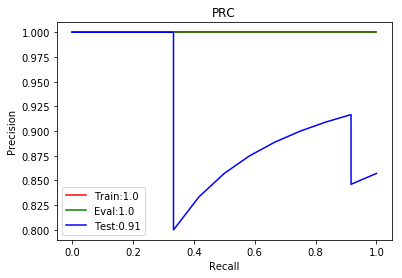

In [38]:
## PRC 
## PRC only valid for binary outcomes. 
## Editing levels < 0.5 are labeled as "0". 
## Editing levels >= 0.5 are labeled as "1". 

from sklearn.metrics import auc, precision_recall_curve

precision_train,recall_train,prc_thresholds_train=precision_recall_curve(train_y>=0.5,train_pred)
precision_eval,recall_eval,prc_thresholds_eval=precision_recall_curve(eval_y>=0.5,eval_pred)
precision_test,recall_test,prc_thresholds_test=precision_recall_curve(test_y>=0.5,test_pred)

auprc_train=auc(recall_train,precision_train)
auprc_eval=auc(recall_eval,precision_eval)
auprc_test=auc(recall_test,precision_test)

plt.plot(recall_train,precision_train,'r',label="Train:"+str(round(auprc_train,2)))
plt.plot(recall_eval,precision_eval,'g',label="Eval:"+str(round(auprc_eval,2)))
plt.plot(recall_test,precision_test,'b',label="Test:"+str(round(auprc_test,2)))
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("PRC")
plt.legend()

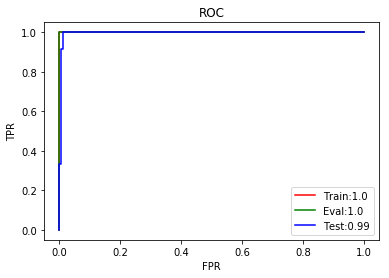

In [39]:
## ROC
from sklearn.metrics import roc_curve, roc_auc_score
fpr_train,tpr_train,roc_thresholds_train=roc_curve(train_y>=0.5,train_pred)
fpr_eval,tpr_eval,roc_thresholds_eval=roc_curve(eval_y>=0.5,eval_pred)
fpr_test,tpr_test,roc_thresholds_test=roc_curve(test_y>=0.5,test_pred)

auroc_train=roc_auc_score(train_y>=0.5,train_pred)
auroc_eval=roc_auc_score(eval_y>=0.5,eval_pred)
auroc_test=roc_auc_score(test_y>=0.5,test_pred)

plt.plot(fpr_train,tpr_train,'r',label="Train:"+str(round(auroc_train,2)))
plt.plot(fpr_eval,tpr_eval,'g',label="Eval:"+str(round(auroc_eval,2)))
plt.plot(fpr_test,tpr_test,'b',label="Test:"+str(round(auroc_test,2)))
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC")
plt.legend()

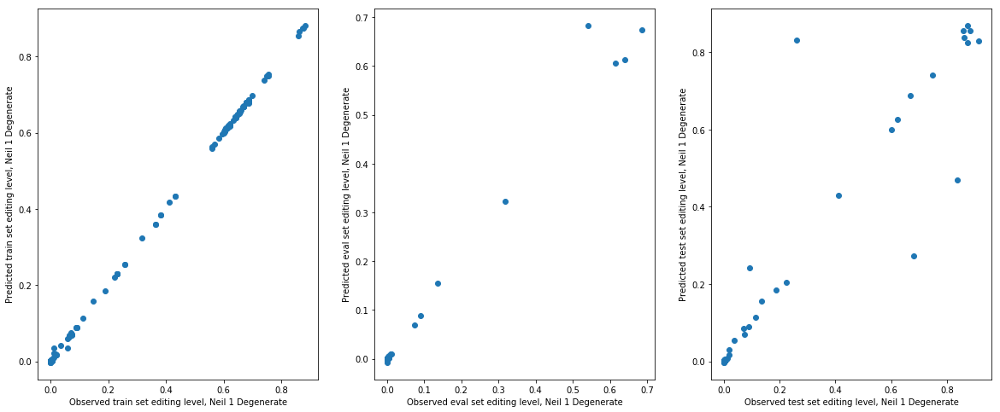

In [40]:
#plot the test set predictions 
matplotlib.rcParams['figure.figsize'] = [20, 8]
plt.subplot(1,3,1)
plt.plot(list(train_y),list(train_pred),'o')
plt.xlabel("Observed train set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted train set editing level, Neil 1 Degenerate")
plt.subplot(1,3,2)
plt.plot(list(eval_y),list(eval_pred),'o')
plt.xlabel("Observed eval set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted eval set editing level, Neil 1 Degenerate")
plt.subplot(1,3,3)
plt.plot(list(test_y),list(test_pred),'o')
plt.xlabel("Observed test set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted test set editing level, Neil 1 Degenerate")

plt.show()

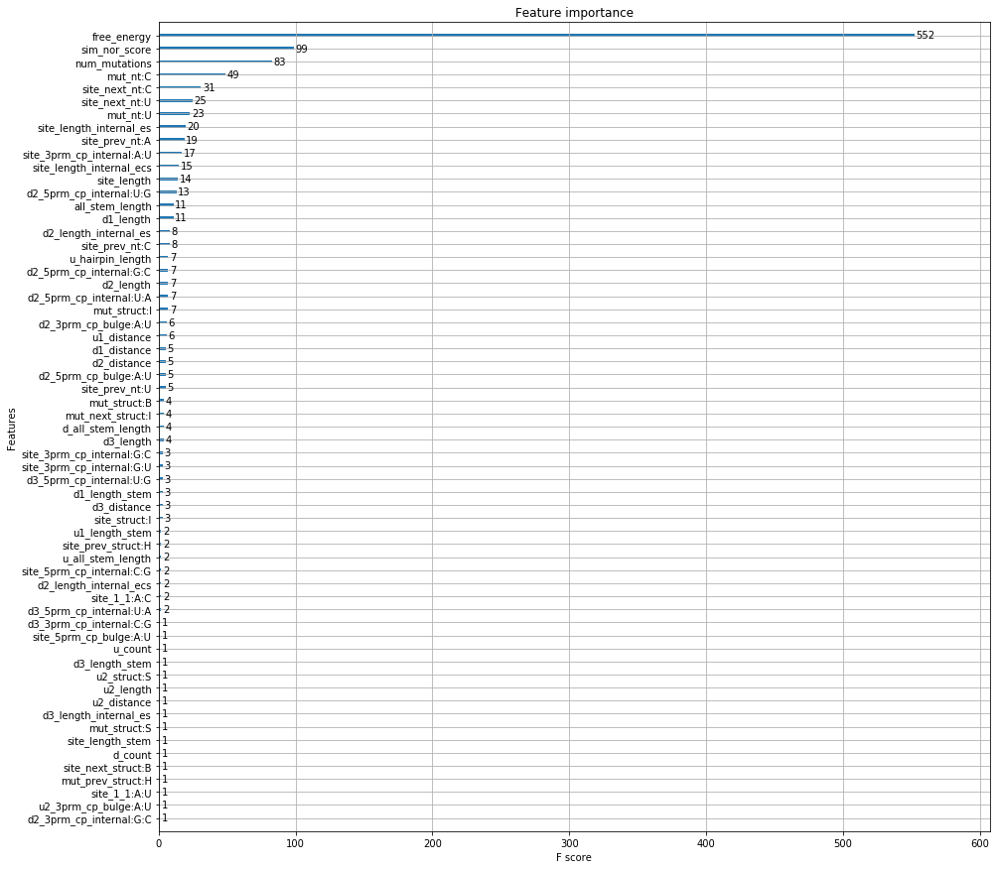

In [41]:
matplotlib.rcParams['figure.figsize'] = [15, 15]
xgboost.plot_importance(bst)

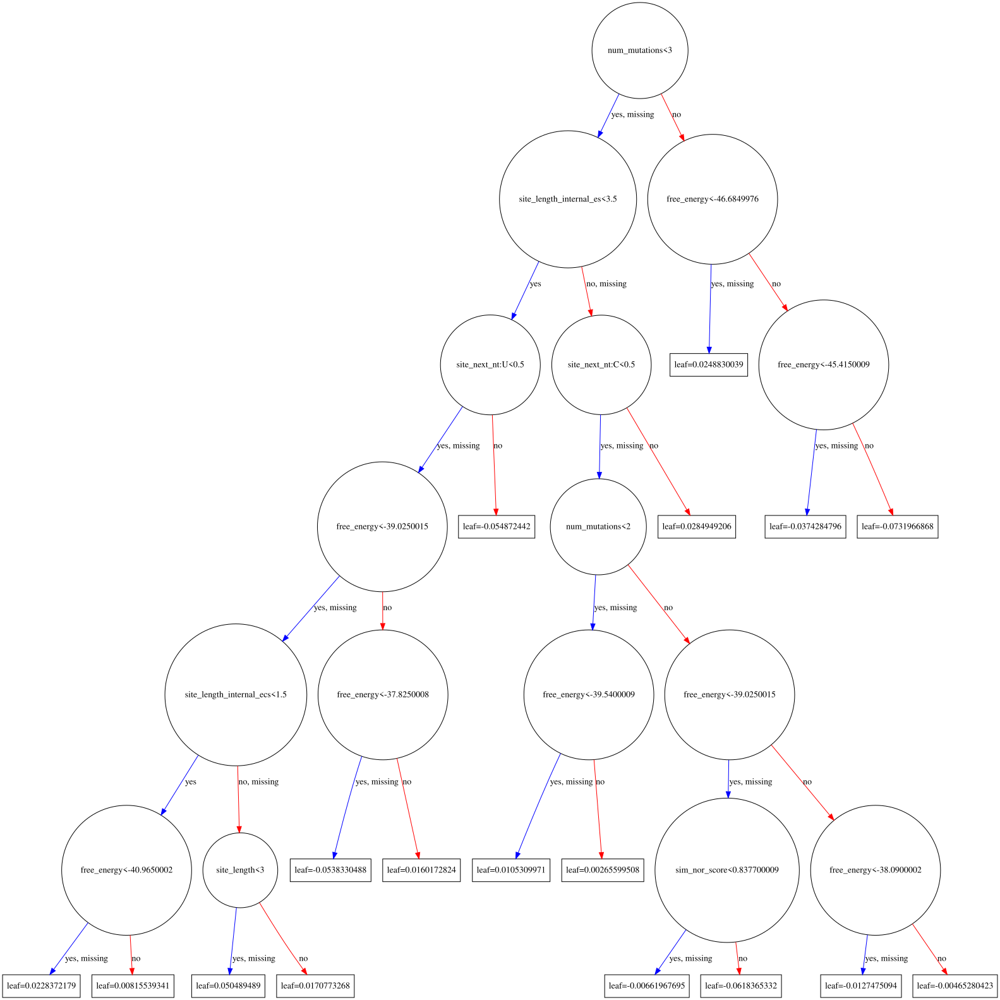

In [42]:
xgboost.to_graphviz(bst, num_trees=2)


In [43]:
# explain the model's predictions using SHAP values
explainer = shap.TreeExplainer(bst)
shap_values = explainer.shap_values(test_X)
shap_values.shape

(160, 151)

In [45]:
test_y=pd.DataFrame(test_y)
max_index=test_y.index[test_y['editing_value'] == max(test_y['editing_value'])]
max_row=test_y.index.get_loc(max_index[0])
# visualize prediction for isoform with the highest editing level 
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[max_row,:], test_X.iloc[max_row,:])

In [46]:
# visualize prediction for isoform with the lowest editing level 
shap.initjs()
min_index=test_y.index[test_y['editing_value'] == min(test_y['editing_value'])]
min_row=test_y.index.get_loc(min_index[0])
shap.force_plot(explainer.expected_value, shap_values[min_row,:], test_X.iloc[min_row,:])

In [47]:
# visualize the training set predictions
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,train_X)

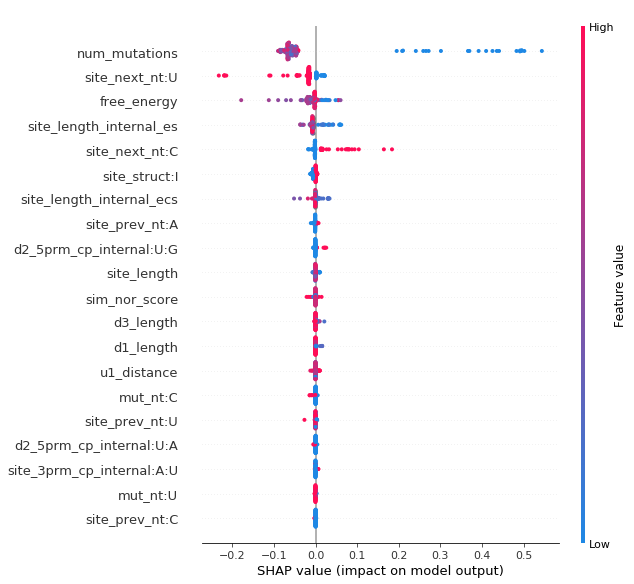

In [48]:
# summarize the effect of all the features 
shap.summary_plot(shap_values, test_X)


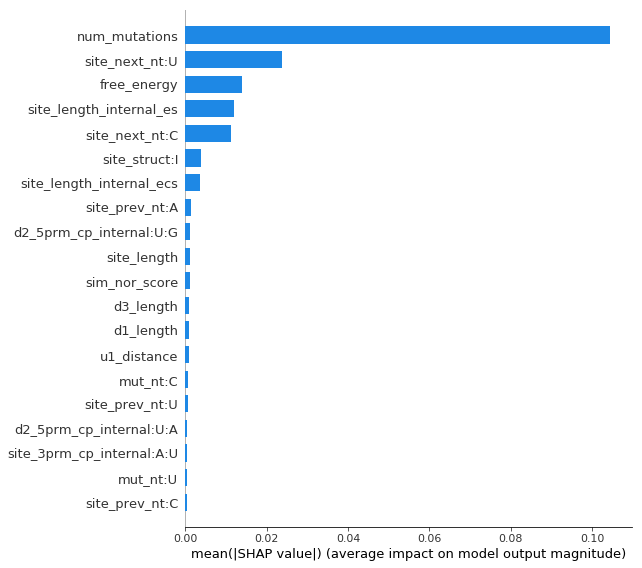

In [49]:
# We can also just take the mean absolute value of the SHAP values for each feature 
# to get a standard bar plot (produces stacked bars for multi-class outputs):
shap.summary_plot(shap_values, test_X, plot_type="bar")

In [50]:
## Compute pairwise interaction values from TreeShap
shap_interaction_values=explainer.shap_interaction_values(test_X)
shap_interaction_values.shape

(160, 151, 151)

In [51]:
##Average interaction values across the datapoints in the test set 
mean_interaction_values=np.mean(shap_interaction_values,axis=0)

In [52]:
Index=test_X.columns
Cols=test_X.columns
mean_interaction_values_df = pd.DataFrame(mean_interaction_values, index=Index, columns=Cols)

In [53]:
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
configure_plotly_browser_state()

trace = Heatmap(z=mean_interaction_values_df.values,
                   x=Cols,
                   y=Index)
iplot([trace],show_link=False)


## Degenerate Dataset: Feature Subsets<a name='2'>
<a href=#outline>Home</a>

In [0]:
shap_values=pd.DataFrame(shap_values,columns=Cols)

['num_mutations$', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*']


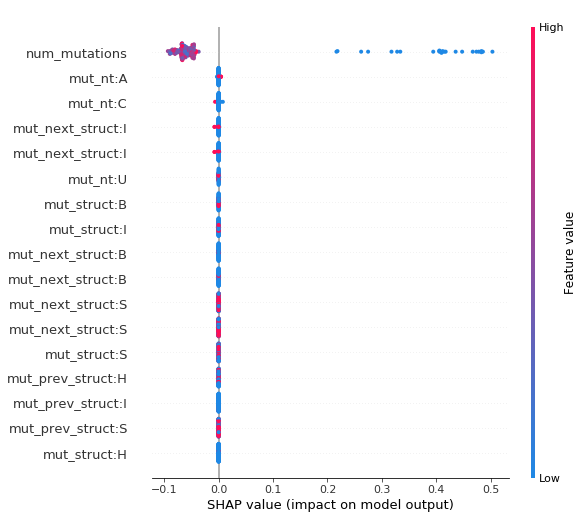

Contribution/Total:0.58161086
['site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length$', 'site_length_stem$', 'site_length_hairpin$', 'site_length_bulge$', 'site_length_internal_es$', 'site_length_internal_ecs$', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*']


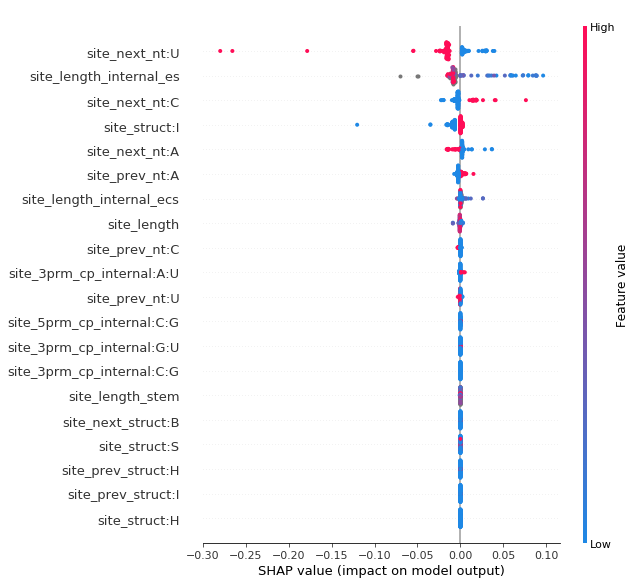

Contribution/Total:0.2918688
['u_count$', 'u_all_stem_length$', 'u_hairpin_length$', 'u1_exist*', 'u1_distance$', 'u1_struct*', 'u1_length$', 'u1_length_stem$', 'u1_length_hairpin$', 'u1_length_bulge$', 'u1_length_internal_es$', 'u1_length_internal_ecs$', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance$', 'u2_struct*', 'u2_length$', 'u2_length_stem$', 'u2_length_hairpin$', 'u2_length_bulge$', 'u2_length_internal_es$', 'u2_length_internal_ecs$', 'u2_5prm_cp_hairpin*', 'u2_5prm_cp_bulge*', 'u2_3prm_cp_bulge*', 'u2_5prm_cp_internal*', 'u2_3prm_cp_internal*', 'u3_exist*', 'u3_distance*', 'u3_struct*', 'u3_length$', 'u3_length_stem$', 'u3_length_hairpin$', 'u3_length_bulge$', 'u3_length_internal_es$', 'u3_length_internal_ecs$', 'u3_5prm_cp_hairpin*', 'u3_5prm_cp_bulge*', 'u3_3prm_cp_bulge*', 'u3_5prm_cp_internal*', 'u3_3prm_cp_internal*']


ValueError: minvalue must be less than or equal to maxvalue

<Figure size 576x684 with 2 Axes>

Contribution/Total:0.0031789052
['d_count*', 'd_all_stem_length*', 'd1_exist*', 'd1_distance*', 'd1_struct*', 'd1_length$', 'd1_length_stem*', 'd1_length_hairpin*', 'd1_length_bulge*', 'd1_length_internal_es*', 'd1_length_internal_ecs*', 'd1_5prm_cp_hairpin*', 'd1_5prm_cp_bulge*', 'd1_3prm_cp_bulge*', 'd1_5prm_cp_internal*', 'd1_3prm_cp_internal*', 'd2_exist*', 'd2_distance*', 'd2_struct*', 'd2_length$', 'd2_length_stem*', 'd2_length_hairpin*', 'd2_length_bulge*', 'd2_length_internal_es*', 'd2_length_internal_ecs*', 'd2_5prm_cp_hairpin*', 'd2_5prm_cp_bulge*', 'd2_3prm_cp_bulge*', 'd2_5prm_cp_internal*', 'd2_3prm_cp_internal*', 'd3_exist*', 'd3_distance*', 'd3_struct*', 'd3_length$', 'd3_length_stem*', 'd3_length_hairpin*', 'd3_length_bulge*', 'd3_length_internal_es*', 'd3_length_internal_ecs*', 'd3_5prm_cp_hairpin*', 'd3_5prm_cp_bulge*', 'd3_3prm_cp_bulge*', 'd3_5prm_cp_internal*', 'd3_3prm_cp_internal*']


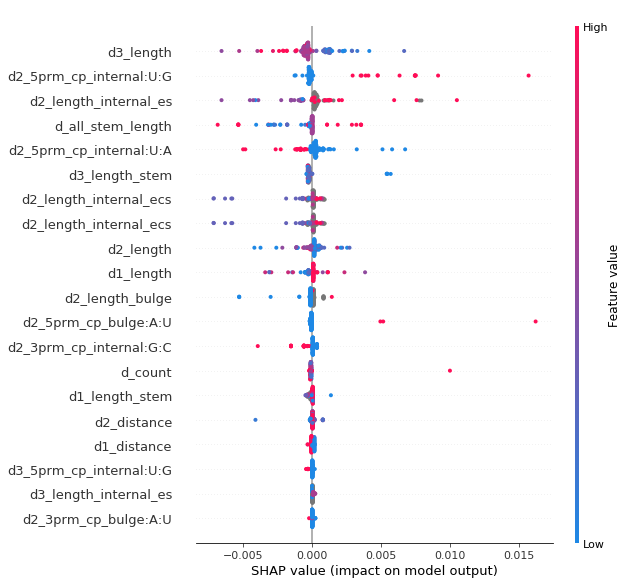

Contribution/Total:0.03389466
['u_count*', 'u_all_stem_length*', 'u_hairpin_length*', 'u1_exist*', 'u1_distance$', 'u1_struct*', 'u1_length$', 'u1_length_stem$', 'u1_length_hairpin$', 'u1_length_bulge$', 'u1_length_internal_es$', 'u1_length_internal_ecs$', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance$', 'u2_struct*', 'u2_length$', 'u2_length_stem$', 'u2_length_hairpin$', 'u2_length_bulge$', 'u2_length_internal_es$', 'u2_length_internal_ecs$', 'u2_5prm_cp_hairpin*', 'u2_5prm_cp_bulge*', 'u2_3prm_cp_bulge*', 'u2_5prm_cp_internal*', 'u2_3prm_cp_internal*', 'u3_exist*', 'u3_distance*', 'u3_struct*', 'u3_length$', 'u3_length_stem$', 'u3_length_hairpin$', 'u3_length_bulge$', 'u3_length_internal_es$', 'u3_length_internal_ecs$', 'u3_5prm_cp_hairpin*', 'u3_5prm_cp_bulge*', 'u3_3prm_cp_bulge*', 'u3_5prm_cp_internal*', 'u3_3prm_cp_internal*', 'd_count*', 'd_all_stem_length*', 'd1_exist*', 'd1_distance*',

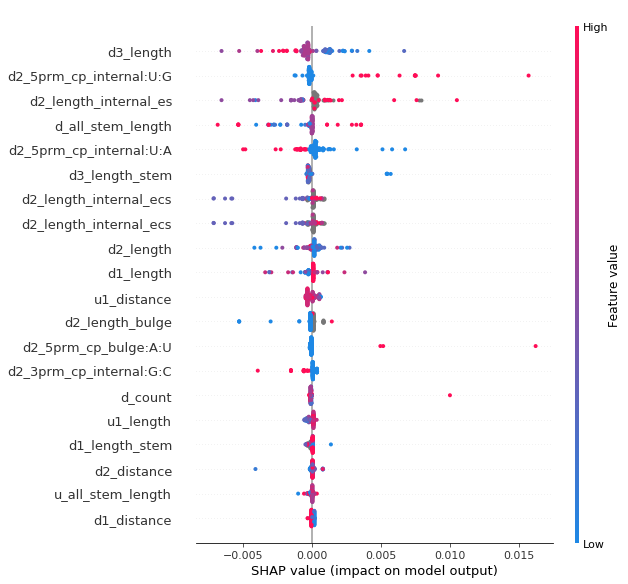

Contribution/Total:0.037073568
['num_mutations*', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length$', 'site_length_stem$', 'site_length_hairpin$', 'site_length_bulge$', 'site_length_internal_es$', 'site_length_internal_ecs$', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*']


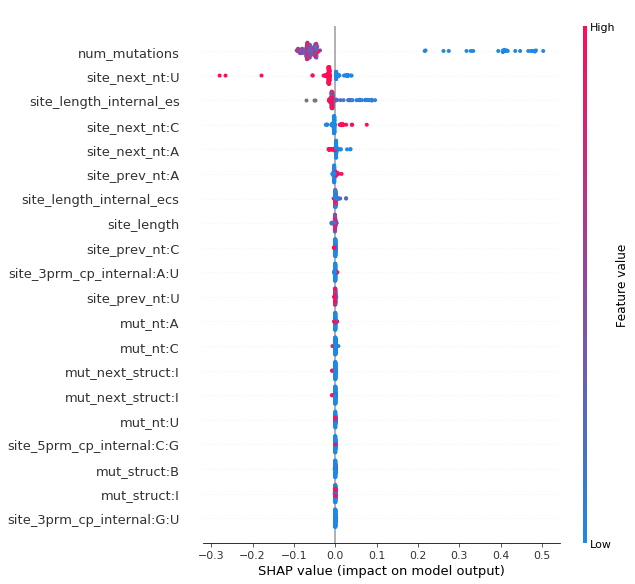

Contribution/Total:0.8436376
['num_mutations*', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*', 'site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length$', 'site_length_stem$', 'site_length_hairpin$', 'site_length_bulge$', 'site_length_internal_es$', 'site_length_internal_ecs$', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*', 'd_count*', 'd_all_stem_length*', 'd1_exist*', 'd1_distance*', 'd1_struct*', 'd1_length$', 'd1_length_stem*', 'd1_length_hairpin*', 'd1_length_bulge*', 'd1_length_internal_es*', 'd1_length_internal_ecs*', 'd1_5prm_cp_hairpin*', 'd1_5prm_cp_bulge*', 'd1_3prm_cp_bulge*', 'd1_5prm_cp_internal*', 'd1_3prm_cp_internal*', 'd2_exist*', 'd2_distance*', 'd2_struct*', 'd2_length$', 'd2_length_stem*', 'd2

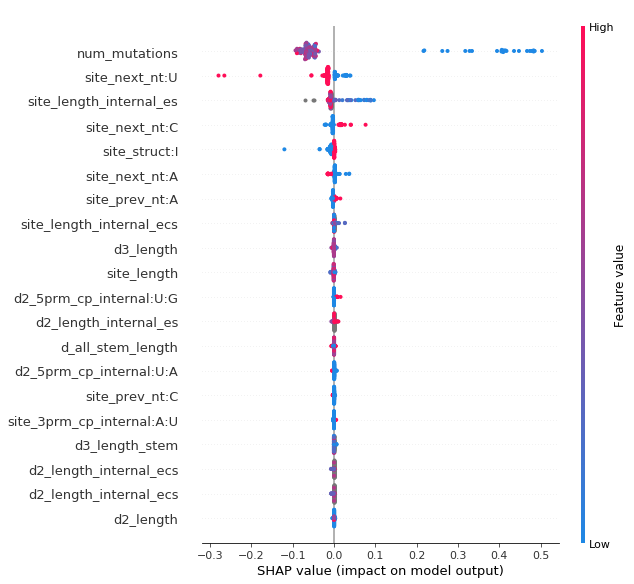

Contribution/Total:0.9073744
['num_mutations*', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*', 'site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length$', 'site_length_stem$', 'site_length_hairpin$', 'site_length_bulge$', 'site_length_internal_es$', 'site_length_internal_ecs$', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*', 'u_count$', 'u_all_stem_length$', 'u_hairpin_length$', 'u1_exist*', 'u1_distance$', 'u1_struct*', 'u1_length$', 'u1_length_stem$', 'u1_length_hairpin$', 'u1_length_bulge$', 'u1_length_internal_es$', 'u1_length_internal_ecs$', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance$', 'u2_struct*', 'u2_length$', '

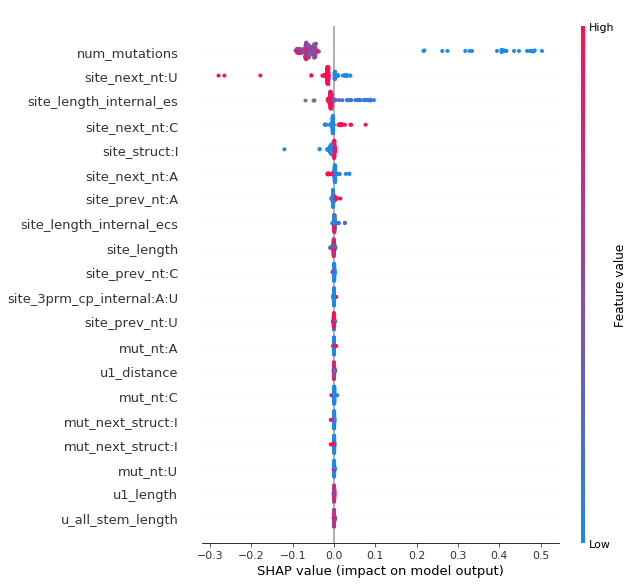

Contribution/Total:0.8766585
['site_struct$', 'site_length$', 'site_length_internal_es$', 'site_length_internal_ecs$', 'site_3prm_cp_internal*']


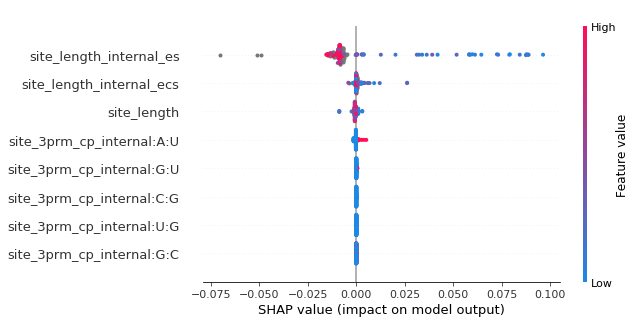

Contribution/Total:0.10023868
['site_prev_nt*', 'site_next_nt*', 'site_1_1_internal*']


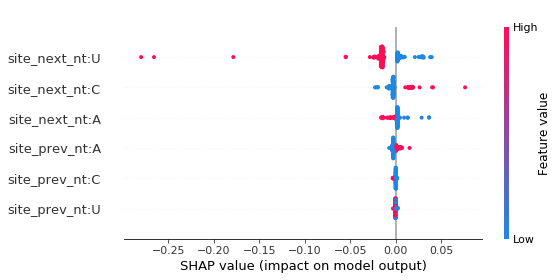

Contribution/Total:0.16131407
['num_mutations$', 'mut_pos$', 'mut_site_dist$', 'mut_ref_nt*', 'mut_nt*']


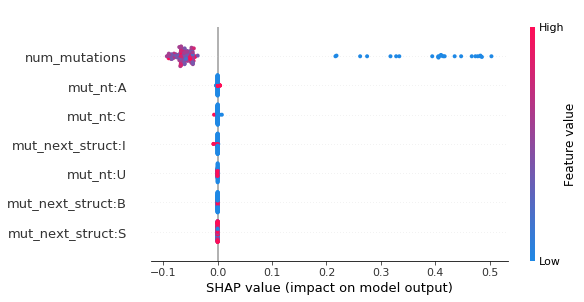

Contribution/Total:0.57994777
['site_prev_nt*', 'site_next_nt*', 'num_mutations', 'mut_pos', 'mut_site_dist', 'mut_ref_nt*', 'mut_nt*']


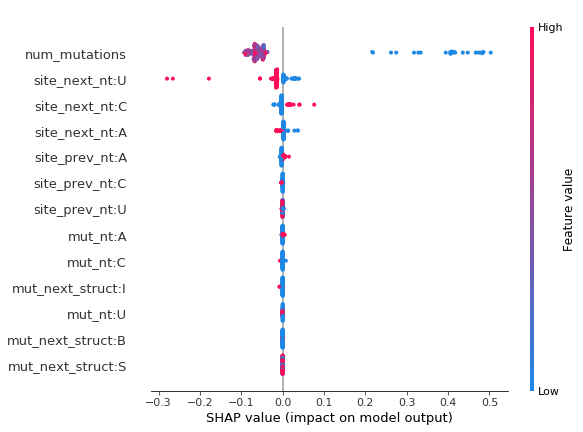

Contribution/Total:0.74126184
['free_energy*', '^all_stem_length$', 'site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length$', 'site_length_stem$', 'site_length_hairpin$', 'site_length_bulge$', 'site_length_internal_es$', 'site_length_internal_ecs$', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*', 'u_count$', 'u_all_stem_length$', 'u_hairpin_length$', 'u1_exist*', 'u1_distance$', 'u1_struct*', 'u1_length$', 'u1_length_stem$', 'u1_length_hairpin$', 'u1_length_bulge$', 'u1_length_internal_es$', 'u1_length_internal_ecs$', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance$', 'u2_struct*', 'u2_length$', 'u2_length_stem$', 'u2_length_hairpin$', 'u2_length_bulge$', 'u2_length_internal_es$', 'u2_length_internal_ecs$', 'u2_5prm_cp_hairpin*', 'u2_5prm_cp_bulge*', '

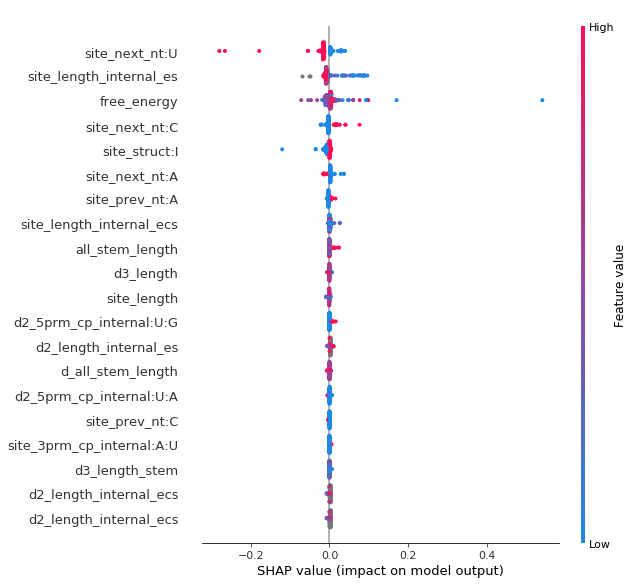

Contribution/Total:0.4116596
['free_energy*', '^all_stem_length$']


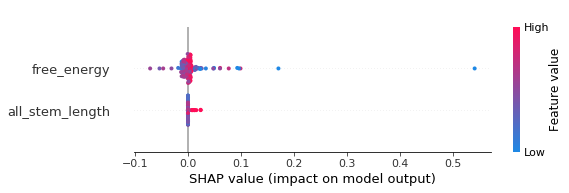

Contribution/Total:0.08271724


In [0]:
from feature_subsets import * 
for subset in [mut,site,u,d,u_d,mut_site,no_up,no_down,site_struct,site_seq,mut_seq,mut_seq_site,no_mut,overall_structure]: 
  print(subset)
  cur_features=filter_features(shap_values,subset)
  cur_feature_shap=shap_values[cur_features].values 
  cur_feature_test_X=test_X[cur_features]
  shap.summary_plot(cur_feature_shap, cur_feature_test_X)#,sort=False,max_display=50)
  print("Contribution/Total:"+str(shap_contribs_subgroup(shap_values,subset)))

## Neil1 Computational features <a name='3'>
<a href=#outline>Home</a>

In [54]:
data=pd.read_csv("../xin_feature_matrices/neil1_computational.features.csv",header=0,sep=',',index_col=0)

In [55]:
#remove any null editing level values 
data=data[~data["editing_value"].isnull().values]
np.unique(np.sort(data['mut_pos']))

array([20., 21., 22., 23., 24., 25., 26., 27., 28., 29., 30., 31., 32.,
       33., 34., 35., 36., 41., 42., 43., 44., 45., 46., 48., 49., 50.,
       51., 52., 53., 54., 55., 56., 57., 58., 59., nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan])

In [56]:
data=format_for_xgboost(data)
train_split,eval_split,test_split=split_train_test_eval_by_mut_pos(data)

(428, 219)
{20.0: 3, 21.0: 3, 22.0: 3, 23.0: 4, 24.0: 3, 25.0: 4, 26.0: 3, 27.0: 4, 28.0: 4, 29.0: 4, 30.0: 3, 31.0: 4, 32.0: 4, 33.0: 4, 34.0: 4, 35.0: 4, 36.0: 4, 41.0: 20, 42.0: 21, 43.0: 18, 44.0: 18, 45.0: 20, 46.0: 19, 48.0: 20, 49.0: 21, 50.0: 21, 51.0: 20, 52.0: 20, 53.0: 21, 54.0: 19, 55.0: 21, 56.0: 20, 57.0: 15, 58.0: 15, 59.0: 16, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 0, nan: 21}


In [57]:
#Remove any non-varying features 
train_novar=get_singleval_features(train_split)
eval_novar=get_singleval_features(eval_split)
test_novar=get_singleval_features(test_split)
uniform_features_to_drop=list(set(train_novar+eval_novar+test_novar))

In [58]:
#Remove any null features 
train_null=get_all_null_features(train_split)
eval_null=get_all_null_features(eval_split)
test_null=get_all_null_features(test_split)
null_features_to_drop=list(set(train_null+eval_null+test_null))

In [59]:
to_drop=list(set(uniform_features_to_drop+null_features_to_drop))
print("\n".join(to_drop))

u3_5prm_cp_internal
d1_5prm_cp_hairpin
site_prev_nt:C
site_1_1:A:U
mut_next_struct:B
u3_exist
d1_3prm_cp_bulge
d2_3prm_cp_internal:G:U
u1_length_internal_es
d1_5prm_cp_internal:U:G
site_5prm_cp_bulge:A:U
u3_length_internal_es
d1_3prm_cp_internal:C:G
d1_length_hairpin
d2_5prm_cp_internal:G:U
mut_ref_struct:B
u2_exist
site_3prm_cp_bulge:A:U
site_prev_struct:B
u2_5prm_cp_hairpin:U:A
u3_5prm_cp_bulge:U:G
site_3prm_cp_internal:U:A
d2_3prm_cp_bulge:U:A
d2_3prm_cp_bulge:U:G
mut_ref_nt:A
site_next_nt:C
site_5prm_cp_internal:U:G
u2_length_internal_ecs
d2_exist
u2_5prm_cp_bulge:A:U
site_struct:B
u3_3prm_cp_internal
site_3prm_cp_bulge:G:C
u2_5prm_cp_bulge:G:U
d1_exist
site_5prm_cp_bulge:G:U
u1_exist
d2_5prm_cp_bulge:G:U
u1_3prm_cp_internal
u1_length_internal_ecs
mut_prev_struct:M
u2_length_internal_es
u3_length_internal_ecs
u2_3prm_cp_internal
u1_5prm_cp_bulge:G:U
d2_5prm_cp_internal:A:U
d3_5prm_cp_hairpin
d2_length_hairpin
site_5prm_cp_bulge:C:G
d2_struct:H
d2_3prm_cp_bulge:G:U
d2_5prm_cp_bulge:

In [60]:
train_split=train_split.drop(to_drop,axis=1)
eval_split=eval_split.drop(to_drop,axis=1)
test_split=test_split.drop(to_drop,axis=1)

In [61]:
train_y=train_split['editing_value']
train_X=train_split.drop(['editing_value'],axis=1)

eval_y=eval_split['editing_value']
eval_X=eval_split.drop(['editing_value'],axis=1)

test_y=test_split['editing_value']
test_X=test_split.drop(['editing_value'],axis=1)

In [62]:
print(train_X.shape)
print(train_y.shape)
print(eval_X.shape)
print(eval_y.shape)
print(test_X.shape)
print(test_y.shape)


(297, 150)
(297,)
(85, 150)
(85,)
(88, 150)
(88,)


In [63]:
## format matrixes for xgboost 
dtrain=xgboost.DMatrix(train_X,train_y)
deval=xgboost.DMatrix(eval_X,eval_y)
dtest=xgboost.DMatrix(test_X,test_y)

In [64]:
## set model training parameters 
param=dict() 
param['nthread'] = 20
#rmse -- root mean square error 
# mae -- mean absolute error 
# map -- mean average precision 
# auc -- area under ROC curve 
# aucpr -- area under precision recall curve 
param['eval_metric'] = ['auc','mae','map','aucpr','rmse']

In [65]:
evallist = [(deval, 'eval'), (dtrain, 'train')]


In [66]:
num_round = 1000
bst = xgboost.train(param, dtrain, num_round, evallist,early_stopping_rounds=10)

[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=6
[0]	eval-auc:0.770773	eval-mae:0.229655	eval-map:1	eval-aucpr:0.440424	eval-rmse:0.265341	train-auc:0.801562	train-mae:0.203374	train-map:1	train-aucpr:0.568764	train-rmse:0.240363
Multiple eval metrics have been passed: 'train-rmse' will be used for early stopping.

Will train until train-rmse hasn't improved in 10 rounds.
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=6
[1]	eval-auc:0.793199	eval-mae:0.175514	eval-map:1	eval-aucpr:0.46261	eval-rmse:0.200166	train-auc:0.816589	train-mae:0.151398	train-map:1	train-aucpr:0.583193	train-rmse:0.178979
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=6
[2]	eval-auc:0.802061	eval-mae:0.137893	eval-map:1	eval-aucpr:0.4758	eval-rmse:0.15731	train-auc:0.82075	train-mae:0.11477	tr

[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=6
[27]	eval-auc:0.824231	eval-mae:0.044483	eval-map:1	eval-aucpr:0.526228	eval-rmse:0.079848	train-auc:0.834295	train-mae:0.01169	train-map:1	train-aucpr:0.610197	train-rmse:0.018855
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=6
[28]	eval-auc:0.823866	eval-mae:0.044502	eval-map:1	eval-aucpr:0.524727	eval-rmse:0.079828	train-auc:0.834346	train-mae:0.011264	train-map:1	train-aucpr:0.610294	train-rmse:0.018359
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra nodes, 0 pruned nodes, max_depth=6
[29]	eval-auc:0.824053	eval-mae:0.044494	eval-map:1	eval-aucpr:0.525478	eval-rmse:0.080049	train-auc:0.834419	train-mae:0.010619	train-map:1	train-aucpr:0.610504	train-rmse:0.017544
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extr

[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 0 pruned nodes, max_depth=6
[54]	eval-auc:0.823979	eval-mae:0.043455	eval-map:1	eval-aucpr:0.525525	eval-rmse:0.080373	train-auc:0.83492	train-mae:0.005067	train-map:1	train-aucpr:0.611415	train-rmse:0.011773
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra nodes, 0 pruned nodes, max_depth=6
[55]	eval-auc:0.823948	eval-mae:0.043411	eval-map:1	eval-aucpr:0.525514	eval-rmse:0.080301	train-auc:0.834933	train-mae:0.004886	train-map:1	train-aucpr:0.611435	train-rmse:0.011639
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=6
[56]	eval-auc:0.824033	eval-mae:0.043334	eval-map:1	eval-aucpr:0.525549	eval-rmse:0.080216	train-auc:0.834933	train-mae:0.004778	train-map:1	train-aucpr:0.611428	train-rmse:0.011528
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extr

[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=6
[81]	eval-auc:0.823859	eval-mae:0.042992	eval-map:1	eval-aucpr:0.525857	eval-rmse:0.080399	train-auc:0.835001	train-mae:0.00247	train-map:1	train-aucpr:0.611548	train-rmse:0.009865
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=6
[82]	eval-auc:0.823595	eval-mae:0.043034	eval-map:1	eval-aucpr:0.524887	eval-rmse:0.080529	train-auc:0.835006	train-mae:0.002379	train-map:1	train-aucpr:0.611572	train-rmse:0.009803
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=6
[83]	eval-auc:0.823432	eval-mae:0.043001	eval-map:1	eval-aucpr:0.524725	eval-rmse:0.080494	train-auc:0.835006	train-mae:0.002368	train-map:1	train-aucpr:0.611572	train-rmse:0.009798
[15:51:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extr

In [67]:
# save to binary file for faster loading
bst.save_model('neil1.computational.model')
# save model to text file 
bst.dump_model('neil1.computational.raw.txt')


In [68]:
## get model predictions on the test, training, and eval splits 
test_pred = bst.predict(dtest)
train_pred=bst.predict(dtrain)
eval_pred=bst.predict(deval)

In [69]:
## get performance metrics on full dataset 
from helpers import * 
print_aggregate_peformance_metrics(train_y,train_pred,
                                   eval_y,eval_pred,
                                   test_y,test_pred,
                                   positive_thresh=0.2)

Train
	Spearman corr : SpearmanrResult(correlation=0.9992056863993521, pvalue=0.0)
	Pearson corr : (0.9992000954889982, 0.0)
	MAE : 0.0019889472250807835
	MAPE : 0.014004968488651199
	RMSE : 0.009653607034015214
	auPRC : 0.9989244639906214
	auROC : 0.9990250317431526
Eval
	Spearman corr : SpearmanrResult(correlation=0.9217260005819393, pvalue=6.822037753255927e-36)
	Pearson corr : (0.9366003776532749, 1.470901753926464e-39)
	MAE : 0.04292287193118211
	MAPE : 0.3172992805013057
	RMSE : 0.08045204352752243
	auPRC : 0.9967924031467036
	auROC : 0.9972129319955407
Test
	Spearman corr : SpearmanrResult(correlation=0.8792173561315284, pvalue=1.9728821646914214e-29)
	Pearson corr : (0.8916154321580823, 2.4513190564458938e-31)
	MAE : 0.05900630724701015
	MAPE : 0.5643507422494299
	RMSE : 0.10001622714813471
	auPRC : 0.9550925797359122
	auROC : 0.9547101449275361


In [70]:
## Correlation values 
from scipy.stats import spearmanr,pearsonr
spearman_train=spearmanr(train_y,train_pred)
spearman_eval=spearmanr(eval_y,eval_pred)
spearman_test=spearmanr(test_y,test_pred)

pearson_train=pearsonr(train_y,train_pred)
pearson_eval=pearsonr(eval_y,eval_pred)
pearson_test=pearsonr(test_y,test_pred)

print("Spearman correlation:")
print("Train:"+str(spearman_train))
print("Eval:"+str(spearman_eval))
print("Test:"+str(spearman_test))
print("\n")
print("Pearson correlation:")
print("Train:"+str(pearson_train))
print("Eval:"+str(pearson_eval))
print("Test:"+str(pearson_test))

Spearman correlation:
Train:SpearmanrResult(correlation=0.9992056863993521, pvalue=0.0)
Eval:SpearmanrResult(correlation=0.9217260005819393, pvalue=6.822037753255927e-36)
Test:SpearmanrResult(correlation=0.8792173561315284, pvalue=1.9728821646914214e-29)


Pearson correlation:
Train:(0.9992000954889982, 0.0)
Eval:(0.9366003776532749, 1.470901753926464e-39)
Test:(0.8916154321580823, 2.4513190564458938e-31)


In [71]:
## MAE
from sklearn.metrics import mean_absolute_error
mae_train=mean_absolute_error(train_y,train_pred)
print("MAE Train:"+str(mae_train))

mae_eval=mean_absolute_error(eval_y,eval_pred)
print("MAE Eval:"+str(mae_eval))

mae_test=mean_absolute_error(test_y,test_pred)
print("MAE Test:"+str(mae_test))


MAE Train:0.0019889472250807835
MAE Eval:0.04292287193118211
MAE Test:0.05900630724701015


In [72]:
## MAPE
pseudocount=0.01
mape_train=np.mean(np.abs((train_y - train_pred) /(pseudocount+train_y))) * 100
print("MAPE Train:"+str(mape_train)+"%")

mape_eval=np.mean(np.abs((eval_y - eval_pred) /(pseudocount+eval_y))) * 100
print("MAPE Eval:"+str(mape_eval)+"%")

mape_test=np.mean(np.abs((test_y - test_pred) /(pseudocount+test_y))) * 100
print("MAPE Test:"+str(mape_test)+"%")

MAPE Train:1.40049684886512%
MAPE Eval:31.729928050130567%
MAPE Test:56.435074224942994%


In [73]:
## RMSE
from sklearn.metrics import mean_squared_error
import math 
rmse_train=math.sqrt(mean_squared_error(train_y,train_pred))
print("RMSE Train:"+str(rmse_train))

rmse_eval=math.sqrt(mean_squared_error(eval_y,eval_pred))
print("RMSE Eval:"+str(rmse_eval))

rmse_test=math.sqrt(mean_squared_error(test_y,test_pred))
print("RMSE Test:"+str(rmse_test))


RMSE Train:0.009653607034015214
RMSE Eval:0.08045204352752243
RMSE Test:0.10001622714813471


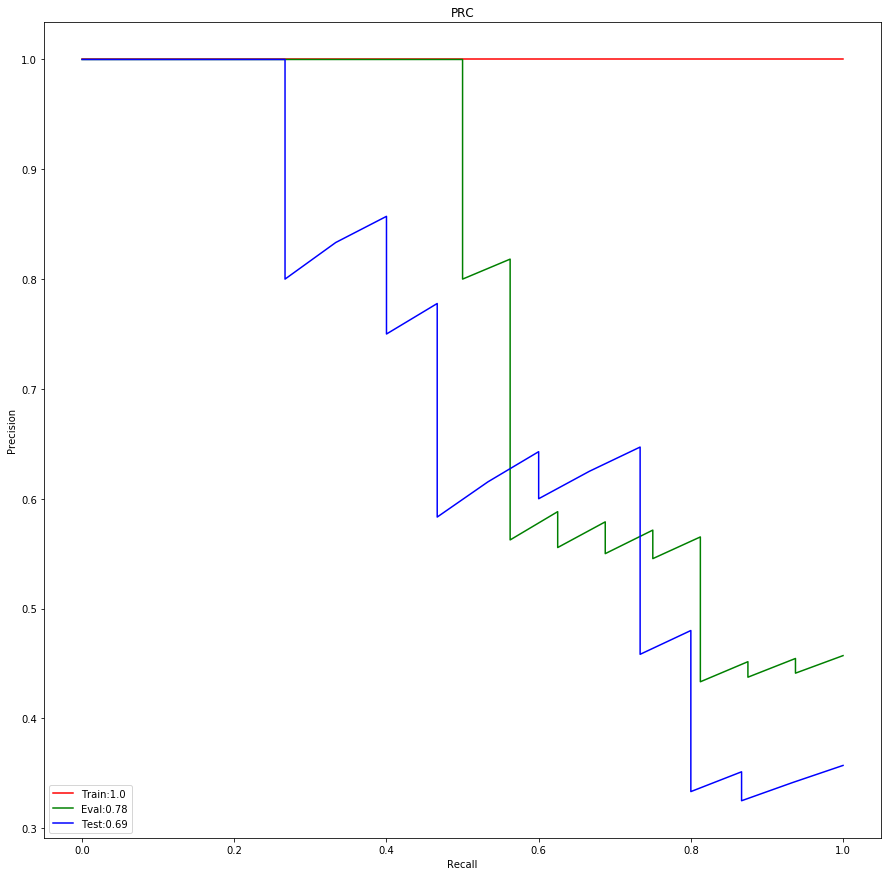

In [74]:
## PRC 
## PRC only valid for binary outcomes. 
## Editing levels < 0.5 are labeled as "0". 
## Editing levels >= 0.5 are labeled as "1". 

from sklearn.metrics import auc, precision_recall_curve

precision_train,recall_train,prc_thresholds_train=precision_recall_curve(train_y>=0.5,train_pred)
precision_eval,recall_eval,prc_thresholds_eval=precision_recall_curve(eval_y>=0.5,eval_pred)
precision_test,recall_test,prc_thresholds_test=precision_recall_curve(test_y>=0.5,test_pred)

auprc_train=auc(recall_train,precision_train)
auprc_eval=auc(recall_eval,precision_eval)
auprc_test=auc(recall_test,precision_test)

plt.plot(recall_train,precision_train,'r',label="Train:"+str(round(auprc_train,2)))
plt.plot(recall_eval,precision_eval,'g',label="Eval:"+str(round(auprc_eval,2)))
plt.plot(recall_test,precision_test,'b',label="Test:"+str(round(auprc_test,2)))
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("PRC")
plt.legend()

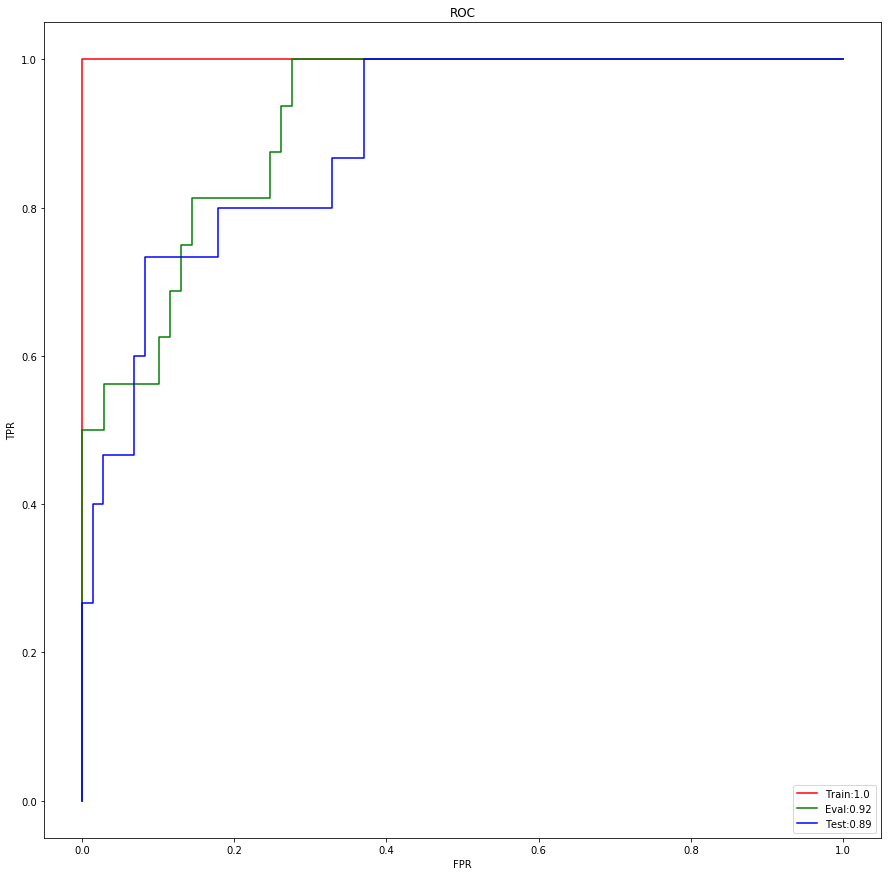

In [75]:
## ROC
from sklearn.metrics import roc_curve, roc_auc_score
fpr_train,tpr_train,roc_thresholds_train=roc_curve(train_y>=0.5,train_pred)
fpr_eval,tpr_eval,roc_thresholds_eval=roc_curve(eval_y>=0.5,eval_pred)
fpr_test,tpr_test,roc_thresholds_test=roc_curve(test_y>=0.5,test_pred)

auroc_train=roc_auc_score(train_y>=0.5,train_pred)
auroc_eval=roc_auc_score(eval_y>=0.5,eval_pred)
auroc_test=roc_auc_score(test_y>=0.5,test_pred)

plt.plot(fpr_train,tpr_train,'r',label="Train:"+str(round(auroc_train,2)))
plt.plot(fpr_eval,tpr_eval,'g',label="Eval:"+str(round(auroc_eval,2)))
plt.plot(fpr_test,tpr_test,'b',label="Test:"+str(round(auroc_test,2)))
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC")
plt.legend()

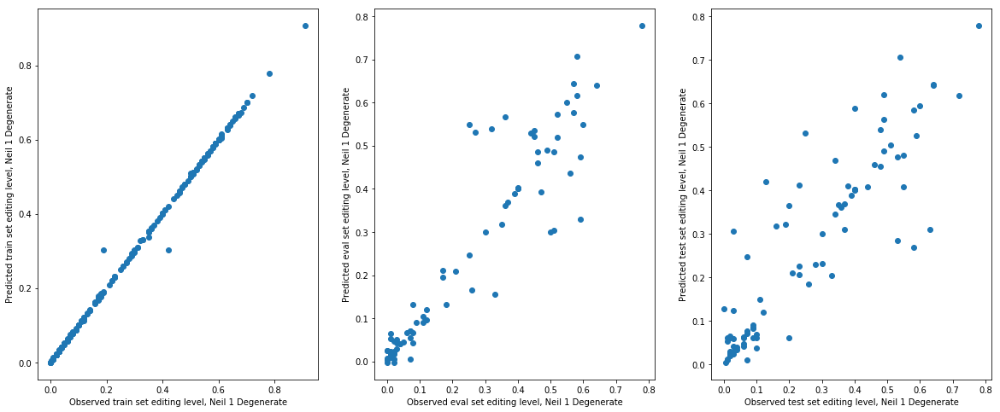

In [76]:
#plot the test set predictions 
matplotlib.rcParams['figure.figsize'] = [20, 8]
plt.subplot(1,3,1)
plt.plot(list(train_y),list(train_pred),'o')
plt.xlabel("Observed train set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted train set editing level, Neil 1 Degenerate")
plt.subplot(1,3,2)
plt.plot(list(eval_y),list(eval_pred),'o')
plt.xlabel("Observed eval set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted eval set editing level, Neil 1 Degenerate")
plt.subplot(1,3,3)
plt.plot(list(test_y),list(test_pred),'o')
plt.xlabel("Observed test set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted test set editing level, Neil 1 Degenerate")

plt.show()

In [77]:
import plotnine
from plotnine import *
test_df=pd.DataFrame({'Observed':test_y,
                     'Predicted':test_pred,
                     'Dataset':'NEIL1_COMP'})

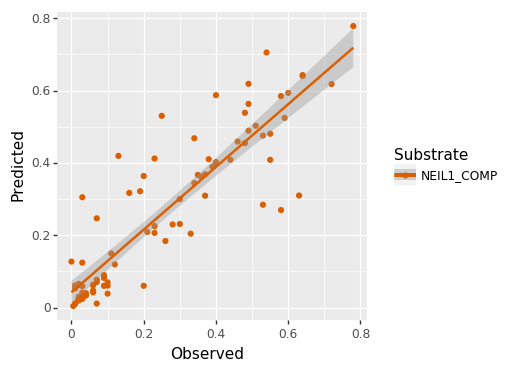

<ggplot: (8731176115576)>


/users/annashch/miniconda3/lib/python3.6/site-packages/plotnine/ggplot.py:706: UserWarning:

Saving 4 x 4 in image.

/users/annashch/miniconda3/lib/python3.6/site-packages/plotnine/ggplot.py:707: UserWarning:

Filename: NEIL1.comp.substrate.svg



In [78]:
plotnine.options.figure_size = (4, 4)

p=(ggplot(test_df, aes('Observed', 'Predicted', color='factor(Dataset)'))
 + geom_point()
 + stat_smooth(method='lm')
 + scale_color_manual(values=['#d95f02'],name="Substrate"))
print(p)
ggsave(plot=p, filename='NEIL1.comp.substrate.svg',width=4,height=4,units='in')


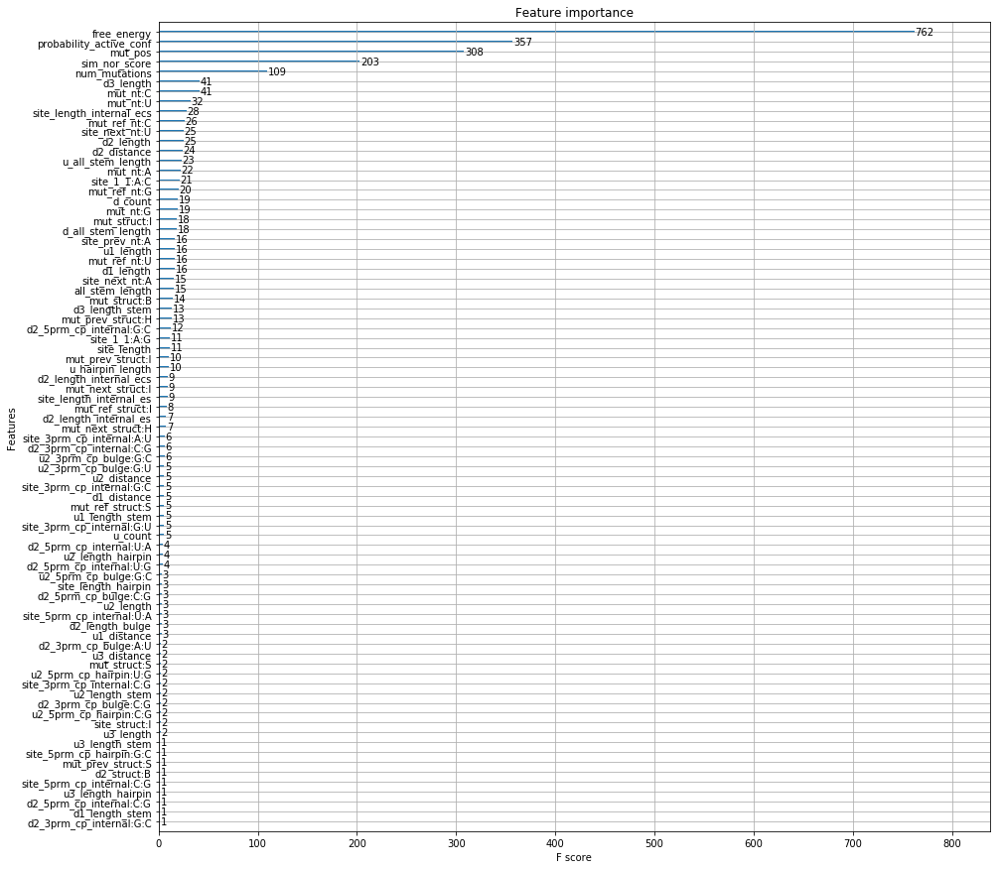

In [79]:
matplotlib.rcParams['figure.figsize'] = [15, 15]
xgboost.plot_importance(bst)

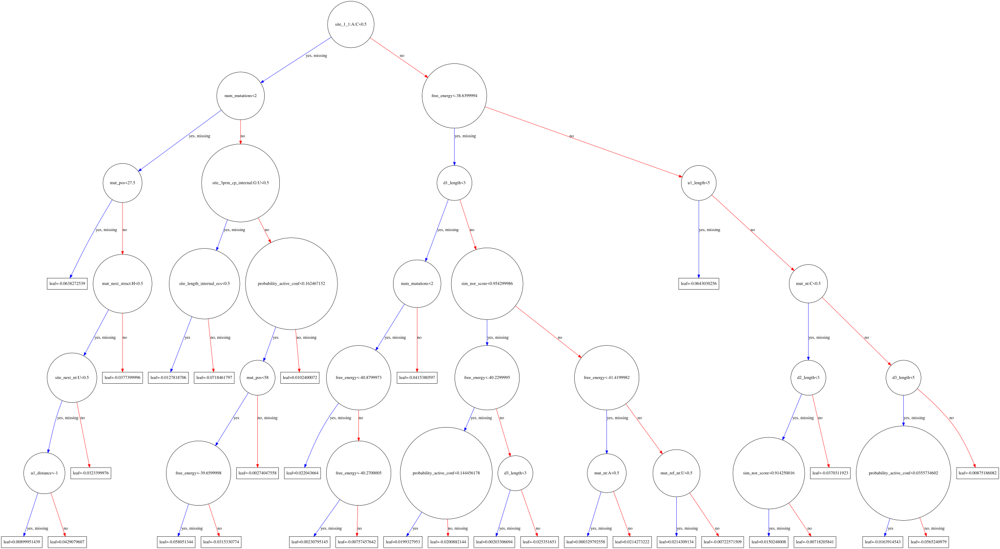

In [80]:
xgboost.to_graphviz(bst, num_trees=2)


In [81]:
# explain the model's predictions using SHAP values
explainer = shap.TreeExplainer(bst)
shap_values = explainer.shap_values(test_X)
shap_values.shape

(88, 150)

In [82]:
test_y = pd.DataFrame(test_y)
max_index=test_y.index[test_y['editing_value'] == max(test_y['editing_value'])]
max_row=test_y.index.get_loc(max_index[0])
# visualize prediction for isoform with the highest editing level 
shap.initjs()
# matplotlib=True
shap.force_plot(explainer.expected_value, shap_values[max_row,:], test_X.iloc[max_row,:])
# plt.savefig("NEIL1.comp.visualize_prediction.highest.svg", format='svg', width=30, height=10, dpi=300, bbox_inches="tight")

In [83]:
# print(test_y[max_row])
print(max(test_y['editing_value']))
print(test_pred[max_row])

0.78
0.7787106


In [84]:
# visualize prediction for isoform with the lowest editing level 
shap.initjs()
min_index=test_y.index[test_y['editing_value'] == min(test_y['editing_value'])]
min_row=test_y.index.get_loc(min_index[0])
shap.force_plot(explainer.expected_value, shap_values[min_row,:], test_X.iloc[min_row,:])
plt.savefig("NEIL1.comp.visualize_prediction.lowest.svg", format='svg', width=30, height=10, dpi=300, bbox_inches="tight")

<Figure size 1080x1080 with 0 Axes>

In [50]:
print(min(test_y['editing_value']))
print(test_pred[min_row])

0.0
-0.014607489


In [40]:
# visualize the training set predictions
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,train_X)

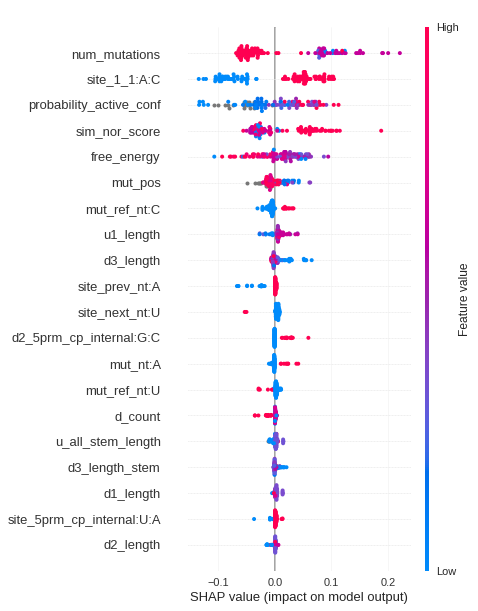

In [48]:
# summarize the effect of all the features 
shap.summary_plot(shap_values, test_X,show=False)
# 
plt.gca().set_facecolor('white')
plt.gca().set_axisbelow(True)
plt.gca().grid(linestyle='-', linewidth='0.5', color='#eeeeee')

# 
plt.gcf().set_size_inches(5, 10)

plt.savefig("NEIL1.comp.shap.svg", format='svg',width=30,height=10,dpi=300,bbox_inches="tight")


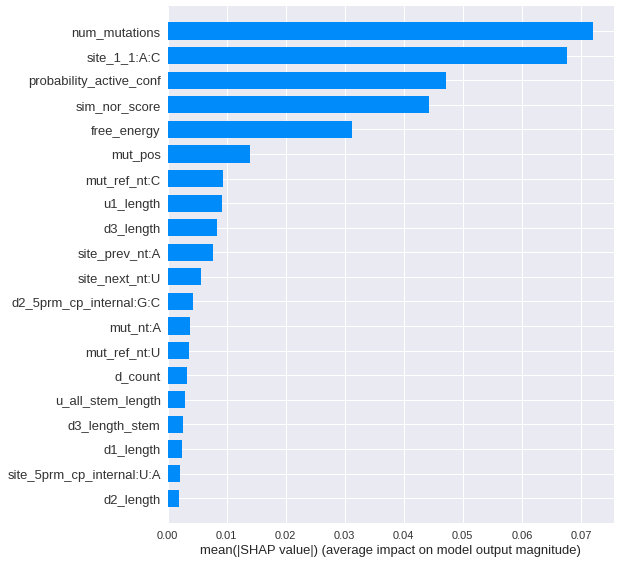

In [41]:
# We can also just take the mean absolute value of the SHAP values for each feature 
# to get a standard bar plot (produces stacked bars for multi-class outputs):
shap.summary_plot(shap_values, test_X, plot_type="bar")

In [42]:
## Compute pairwise interaction values from TreeShap
shap_interaction_values=explainer.shap_interaction_values(test_X)
shap_interaction_values.shape

(106, 141, 141)

In [0]:
##Average interaction values across the datapoints in the test set 
mean_interaction_values=np.mean(shap_interaction_values,axis=0)

In [0]:
Index=test_X.columns
Cols=test_X.columns
mean_interaction_values_df = pd.DataFrame(mean_interaction_values, index=Index, columns=Cols)

In [45]:
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
configure_plotly_browser_state()

trace = Heatmap(z=mean_interaction_values_df.values,
                   x=Cols,
                   y=Index)
iplot([trace],show_link=False)


## Computational Dataset: Feature Subsets<a name='4'>
<a href=#outline>Home</a>

# New Section

In [0]:
shap_values=pd.DataFrame(shap_values,columns=Cols)

['num_mutations*', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*']


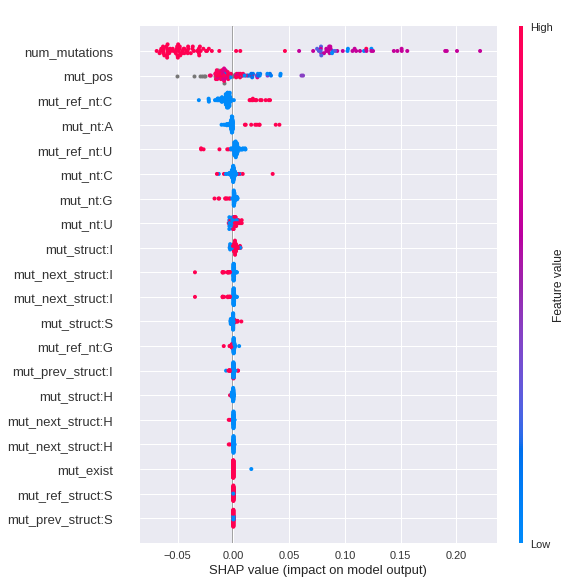

Contribution/Total:0.3088912
['site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length*', 'site_length_stem*', 'site_length_hairpin*', 'site_length_bulge*', 'site_length_internal_es*', 'site_length_internal_ecs*', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*']


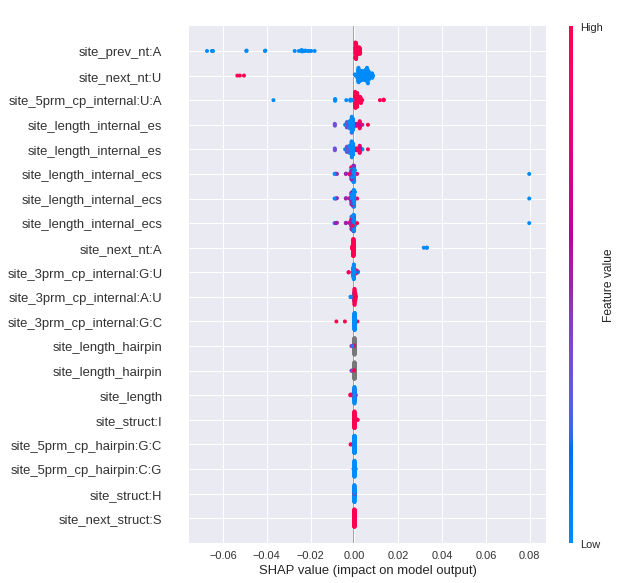

Contribution/Total:0.072672725
['u_count*', 'u_all_stem_length*', 'u_hairpin_length*', 'u1_exist*', 'u1_distance*', 'u1_struct*', 'u1_length*', 'u1_length_stem*', 'u1_length_hairpin*', 'u1_length_bulge*', 'u1_length_internal_es*', 'u1_length_internal_ecs*', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance*', 'u2_struct*', 'u2_length*', 'u2_length_stem*', 'u2_length_hairpin*', 'u2_length_bulge*', 'u2_length_internal_es*', 'u2_length_internal_ecs*', 'u2_5prm_cp_hairpin*', 'u2_5prm_cp_bulge*', 'u2_3prm_cp_bulge*', 'u2_5prm_cp_internal*', 'u2_3prm_cp_internal*', 'u3_exist*', 'u3_distance*', 'u3_struct*', 'u3_length*', 'u3_length_stem*', 'u3_length_hairpin*', 'u3_length_bulge*', 'u3_length_internal_es*', 'u3_length_internal_ecs*', 'u3_5prm_cp_hairpin*', 'u3_5prm_cp_bulge*', 'u3_3prm_cp_bulge*', 'u3_5prm_cp_internal*', 'u3_3prm_cp_internal*']


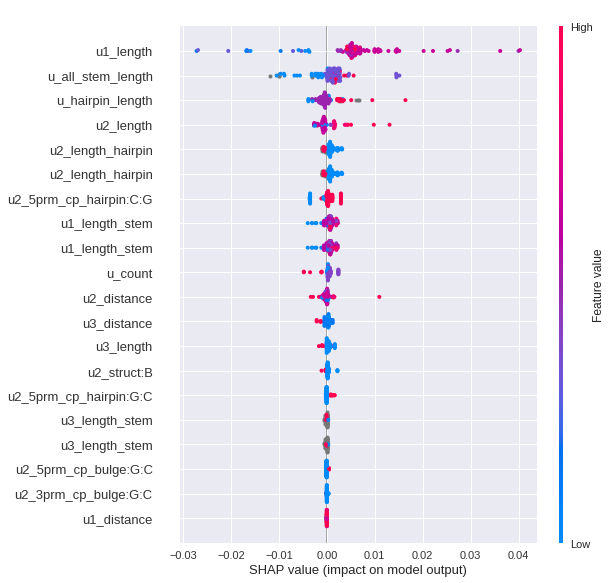

Contribution/Total:0.060372278
['d_count*', 'd_all_stem_length*', 'd1_exist*', 'd1_distance*', 'd1_struct*', 'd1_length*', 'd1_length_stem*', 'd1_length_hairpin*', 'd1_length_bulge*', 'd1_length_internal_es*', 'd1_length_internal_ecs*', 'd1_5prm_cp_hairpin*', 'd1_5prm_cp_bulge*', 'd1_3prm_cp_bulge*', 'd1_5prm_cp_internal*', 'd1_3prm_cp_internal*', 'd2_exist*', 'd2_distance*', 'd2_struct*', 'd2_length*', 'd2_length_stem*', 'd2_length_hairpin*', 'd2_length_bulge*', 'd2_length_internal_es*', 'd2_length_internal_ecs*', 'd2_5prm_cp_hairpin*', 'd2_5prm_cp_bulge*', 'd2_3prm_cp_bulge*', 'd2_5prm_cp_internal*', 'd2_3prm_cp_internal*', 'd3_exist*', 'd3_distance*', 'd3_struct*', 'd3_length*', 'd3_length_stem*', 'd3_length_hairpin*', 'd3_length_bulge*', 'd3_length_internal_es*', 'd3_length_internal_ecs*', 'd3_5prm_cp_hairpin*', 'd3_5prm_cp_bulge*', 'd3_3prm_cp_bulge*', 'd3_5prm_cp_internal*', 'd3_3prm_cp_internal*']


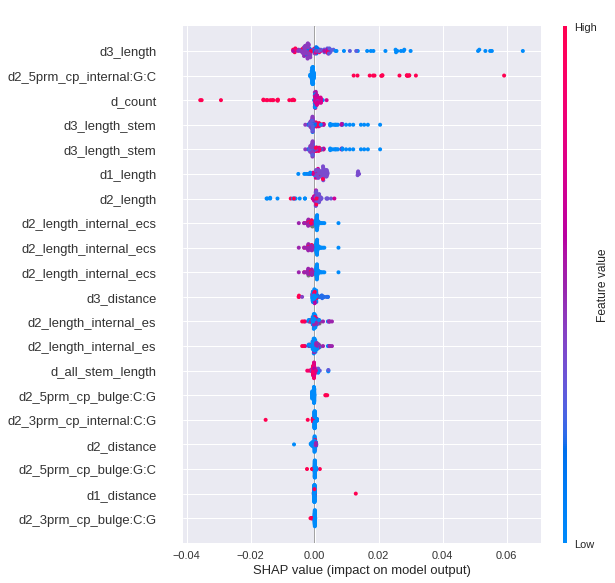

Contribution/Total:0.08961322
['u_count*', 'u_all_stem_length*', 'u_hairpin_length*', 'u1_exist*', 'u1_distance*', 'u1_struct*', 'u1_length*', 'u1_length_stem*', 'u1_length_hairpin*', 'u1_length_bulge*', 'u1_length_internal_es*', 'u1_length_internal_ecs*', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance*', 'u2_struct*', 'u2_length*', 'u2_length_stem*', 'u2_length_hairpin*', 'u2_length_bulge*', 'u2_length_internal_es*', 'u2_length_internal_ecs*', 'u2_5prm_cp_hairpin*', 'u2_5prm_cp_bulge*', 'u2_3prm_cp_bulge*', 'u2_5prm_cp_internal*', 'u2_3prm_cp_internal*', 'u3_exist*', 'u3_distance*', 'u3_struct*', 'u3_length*', 'u3_length_stem*', 'u3_length_hairpin*', 'u3_length_bulge*', 'u3_length_internal_es*', 'u3_length_internal_ecs*', 'u3_5prm_cp_hairpin*', 'u3_5prm_cp_bulge*', 'u3_3prm_cp_bulge*', 'u3_5prm_cp_internal*', 'u3_3prm_cp_internal*', 'd_count*', 'd_all_stem_length*', 'd1_exist*', 'd1_distance*',

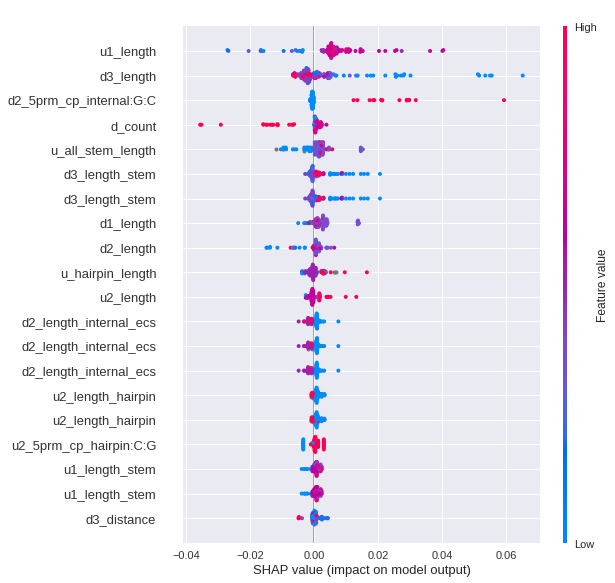

Contribution/Total:0.1499855
['num_mutations*', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length*', 'site_length_stem*', 'site_length_hairpin*', 'site_length_bulge*', 'site_length_internal_es*', 'site_length_internal_ecs*', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*']


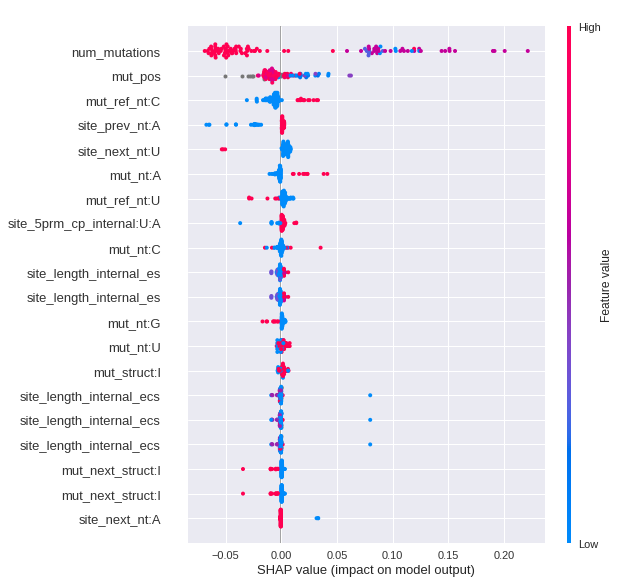

Contribution/Total:0.38126156
['num_mutations*', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*', 'site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length*', 'site_length_stem*', 'site_length_hairpin*', 'site_length_bulge*', 'site_length_internal_es*', 'site_length_internal_ecs*', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*', 'd_count*', 'd_all_stem_length*', 'd1_exist*', 'd1_distance*', 'd1_struct*', 'd1_length*', 'd1_length_stem*', 'd1_length_hairpin*', 'd1_length_bulge*', 'd1_length_internal_es*', 'd1_length_internal_ecs*', 'd1_5prm_cp_hairpin*', 'd1_5prm_cp_bulge*', 'd1_3prm_cp_bulge*', 'd1_5prm_cp_internal*', 'd1_3prm_cp_internal*', 'd2_exist*', 'd2_distance*', 'd2_struct*', 'd2_length*', 'd2_length_stem*', 'd

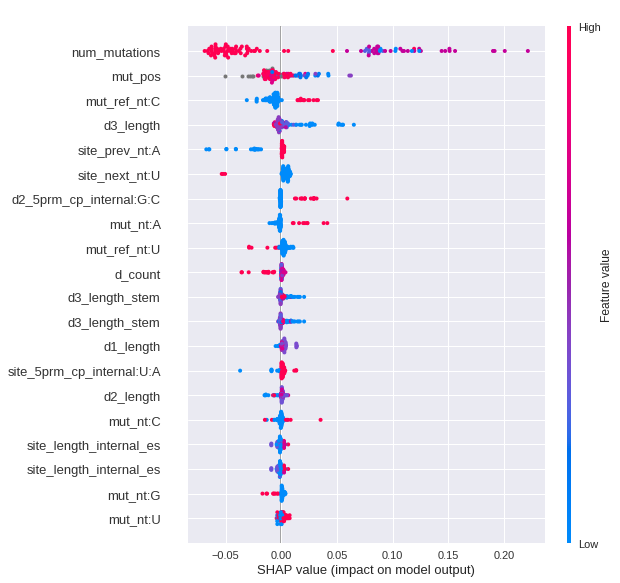

Contribution/Total:0.4711772
['num_mutations*', 'mut_exist*', 'mut_type*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_ref_struct*', 'mut_nt*', 'mut_struct*', 'mut_prev_struct*', 'mut_next_struct*', 'mut_same_as_site*', 'site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length*', 'site_length_stem*', 'site_length_hairpin*', 'site_length_bulge*', 'site_length_internal_es*', 'site_length_internal_ecs*', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*', 'u_count*', 'u_all_stem_length*', 'u_hairpin_length*', 'u1_exist*', 'u1_distance*', 'u1_struct*', 'u1_length*', 'u1_length_stem*', 'u1_length_hairpin*', 'u1_length_bulge*', 'u1_length_internal_es*', 'u1_length_internal_ecs*', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance*', 'u2_struct*', 'u2_length*', '

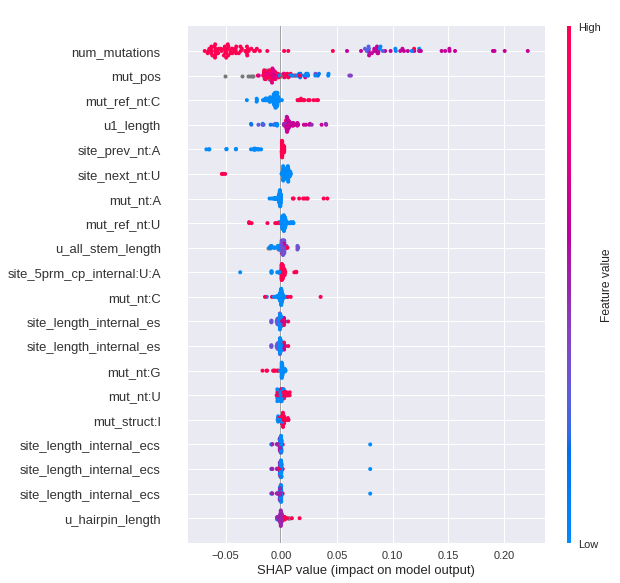

Contribution/Total:0.44193625
['site_struct*', 'site_length*', 'site_length_internal_es*', 'site_length_internal_ecs*', 'site_3prm_cp_internal*']


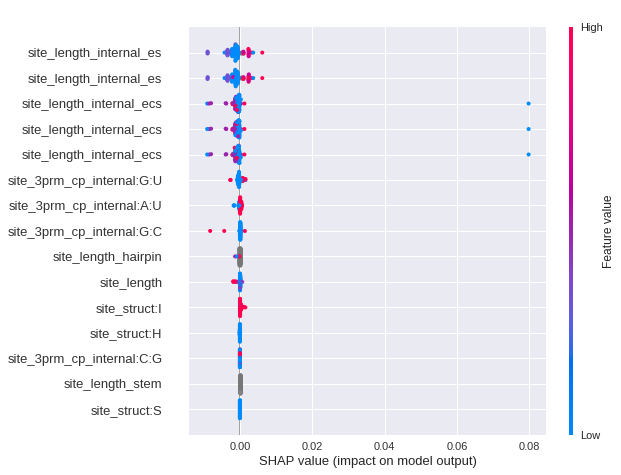

Contribution/Total:0.027216306
['site_prev_nt*', 'site_next_nt*', 'site_1_1_internal*']


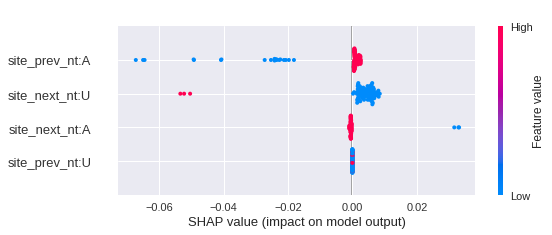

Contribution/Total:0.03914322
['num_mutations*', 'mut_pos*', 'mut_site_dist*', 'mut_ref_nt*', 'mut_nt*']


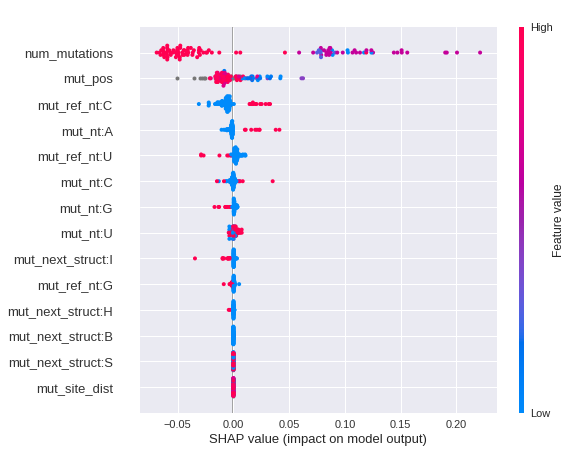

Contribution/Total:0.29442492
['site_prev_nt*', 'site_next_nt*', 'num_mutations', 'mut_pos', 'mut_site_dist', 'mut_ref_nt*', 'mut_nt*']


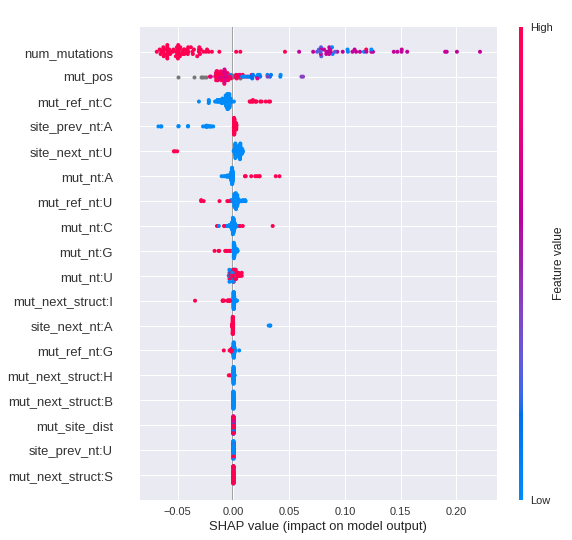

Contribution/Total:0.3335682
['free_energy*', 'all_stem_length*', 'site_struct*', 'site_prev_nt*', 'site_next_nt*', 'site_prev_struct*', 'site_next_struct*', 'site_1_1_internal*', 'site_length*', 'site_length_stem*', 'site_length_hairpin*', 'site_length_bulge*', 'site_length_internal_es*', 'site_length_internal_ecs*', 'site_5prm_cp_hairpin*', 'site_5prm_cp_bulge*', 'site_3prm_cp_bulge*', 'site_5prm_cp_internal*', 'site_3prm_cp_internal*', 'u_count*', 'u_all_stem_length*', 'u_hairpin_length*', 'u1_exist*', 'u1_distance*', 'u1_struct*', 'u1_length*', 'u1_length_stem*', 'u1_length_hairpin*', 'u1_length_bulge*', 'u1_length_internal_es*', 'u1_length_internal_ecs*', 'u1_5prm_cp_hairpin*', 'u1_5prm_cp_bulge*', 'u1_3prm_cp_bulge*', 'u1_5prm_cp_internal*', 'u1_3prm_cp_internal*', 'u2_exist*', 'u2_distance*', 'u2_struct*', 'u2_length*', 'u2_length_stem*', 'u2_length_hairpin*', 'u2_length_bulge*', 'u2_length_internal_es*', 'u2_length_internal_ecs*', 'u2_5prm_cp_hairpin*', 'u2_5prm_cp_bulge*', 'u2

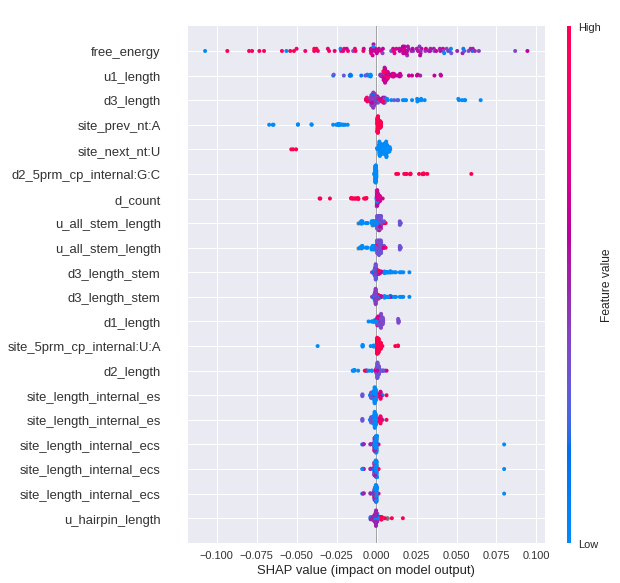

Contribution/Total:0.31636453
['free_energy*', 'sim_nor_score*', 'probability_active_conf*']


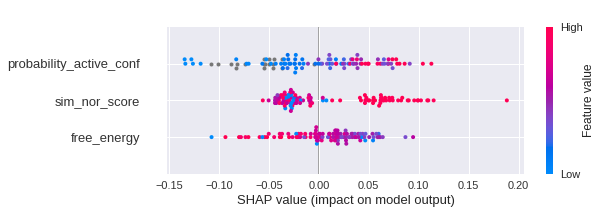

Contribution/Total:0.32660377


In [47]:
from feature_subsets import * 
subset_names=["mut","site","u","d","u_d","mut_site","no_up","no_down","site_struct","site_seq","mut_seq","mut_seq_site","no_mut","overall_structure"]
subset_contribs=[]
for subset in [mut,site,u,d,u_d,mut_site,no_up,no_down,site_struct,site_seq,mut_seq,mut_seq_site,no_mut,overall_structure]: 
  print(subset)
  cur_features=filter_features(shap_values,subset)
  cur_feature_shap=shap_values[cur_features].values 
  cur_feature_data_X=test_X[cur_features]
  shap.summary_plot(cur_feature_shap, cur_feature_data_X)#,sort=False,max_display=50)
  contrib=shap_contribs_subgroup(shap_values,subset)
  subset_contribs.append(contrib)
  print("Contribution/Total:"+str(contrib))

In [0]:
subset_contrib_df=pd.DataFrame({'Subset':subset_names,
                               'Contribution':[100*i for i in subset_contribs]})

In [0]:
subset_contrib_df=subset_contrib_df.sort_values(by=['Contribution'],ascending=False)
subset_contrib_df.reset_index(inplace=True, drop=True) 

In [0]:
from pandas.api.types import CategoricalDtype


In [0]:
subset_cat = CategoricalDtype(categories=list(subset_contrib_df['Subset']), ordered=True)

# Cast the existing categories into the new category. Due to a bug in pandas
# we need to do this via a string.
subset_contrib_df['Subset_Cat'] = subset_contrib_df['Subset'].astype(str).astype(subset_cat)


In [0]:
subset_contrib_df
subset_contrib_df.to_csv('NEIL1.comp.subset.importance.csv')

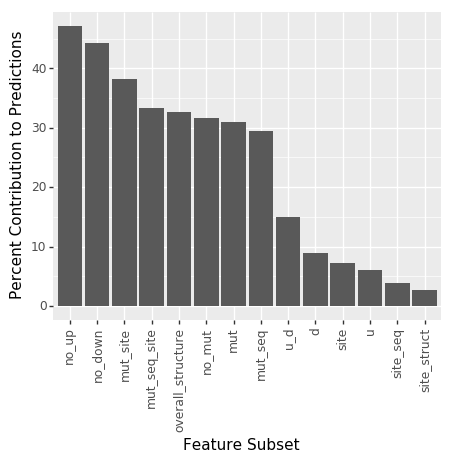

<ggplot: (8741414011968)>

In [53]:
p=(ggplot(subset_contrib_df, aes('Subset_Cat', 'Contribution'))
 + geom_bar(stat='identity')
 + xlab("Feature Subset")
 + ylab("Percent Contribution to Predictions")
 + theme(axis_text_x=element_text(angle=90))
)
ggsave(plot=p, filename='NEIL1.comp.subset.importance.svg',width=5,height=4,units='in')
p

## No "mut" features

In [0]:
## Read in the data 
import feature_subsets
import pandas as pd 
data=pd.read_csv("../xin_feature_matrices/neil1_degenerate_computational.features.csv",header=0,sep=',',index_col=0)
#drop all mut features
cur_features=filter_features(data,feature_subsets.mut)
cur_features.remove('mut_pos')
data=data.drop(cur_features,axis=1)
data.head


<bound method NDFrame.head of         editing_value  free_energy  mut_pos mut_ref_struct  all_stem_length  \
rna_id                                                                        
DG0033         0.9145       -42.11     48.0              S               29   
DG0039         0.8835       -43.32     48.0              S               30   
DG0039         0.8835       -43.32     52.0              I               30   
DG0040         0.8580       -39.73     48.0              S               28   
DG0040         0.8580       -39.73     53.0              S               28   
DG0041         0.8755       -43.84     48.0              S               30   
DG0041         0.8755       -43.84     51.0              I               30   
DG0043         0.8730       -39.42     48.0              S               27   
DG0043         0.8730       -39.42     54.0              S               27   
DG0046         0.8630       -43.77     48.0              S               30   
DG0046         0.8630 

In [0]:
#remove any null editing level values 
data=data[~data["editing_value"].isnull().values]

In [0]:
data=format_for_xgboost(data)
train_split,eval_split,test_split=split_train_test_eval_by_mut_pos(data)

(856, 178)
{44.0: 98, 45.0: 155, 46.0: 124, 48.0: 160, 49.0: 79, 50.0: 97, 51.0: 12, 52.0: 12, 53.0: 10, 54.0: 12, 55.0: 97}


In [0]:
#Remove any non-varying features 
train_novar=get_singleval_features(train_split)
eval_novar=get_singleval_features(eval_split)
test_novar=get_singleval_features(test_split)
uniform_features_to_drop=list(set(train_novar+eval_novar+test_novar))

In [0]:
#Remove any null features 
train_null=get_all_null_features(train_split)
eval_null=get_all_null_features(eval_split)
test_null=get_all_null_features(test_split)
null_features_to_drop=list(set(train_null+eval_null+test_null))

In [0]:
to_drop=list(set(uniform_features_to_drop+null_features_to_drop))
to_drop.append("mut_pos")
print("\n".join(to_drop))

u2_5prm_cp_hairpin:U:G
u1_5prm_cp_hairpin:C:G
u1_exist
d2_5prm_cp_bulge:C:G
d1_length_hairpin
u2_5prm_cp_bulge:G:U
u1_length_internal_es
u2_length_internal_es
u2_exist
d2_exist
mut_pos
u3_3prm_cp_internal
d1_5prm_cp_hairpin
d3_5prm_cp_hairpin
d1_exist
u3_length_internal_es
d2_length_hairpin
u1_5prm_cp_internal
d2_3prm_cp_internal:A:U
mut_ref_struct:S
d3_exist
u1_3prm_cp_internal
u1_length_internal_ecs
d2_5prm_cp_hairpin
d3_length_hairpin
u2_5prm_cp_internal
d2_3prm_cp_internal:G:U
d2_5prm_cp_bulge:G:U
u3_length_internal_ecs
d2_3prm_cp_bulge:G:C
mut_ref_struct:I
u2_3prm_cp_internal
u3_5prm_cp_internal
u3_3prm_cp_bulge:U:A
d2_3prm_cp_bulge:G:U
site_5prm_cp_bulge:G:U
u2_5prm_cp_bulge:U:A
u2_length_internal_ecs
mut_pos


In [0]:
train_split=train_split.drop(to_drop,axis=1)
eval_split=eval_split.drop(to_drop,axis=1)
test_split=test_split.drop(to_drop,axis=1)

In [0]:
train_y=train_split['editing_value']
train_X=train_split.drop(['editing_value'],axis=1)

eval_y=eval_split['editing_value']
eval_X=eval_split.drop(['editing_value'],axis=1)

test_y=test_split['editing_value']
test_X=test_split.drop(['editing_value'],axis=1)

In [0]:
print(train_X.shape)
print(train_y.shape)
print(eval_X.shape)
print(eval_y.shape)
print(test_X.shape)
print(test_y.shape)


(590, 139)
(590,)
(98, 139)
(98,)
(167, 139)
(167,)


In [0]:
## format matrixes for xgboost 
import xgboost
dtrain=xgboost.DMatrix(train_X,train_y)
deval=xgboost.DMatrix(eval_X,eval_y)
dtest=xgboost.DMatrix(test_X,test_y)

In [0]:
## set model training parameters 
param=dict() 
param['nthread'] = 20
#rmse -- root mean square error 
# mae -- mean absolute error 
# map -- mean average precision 
# auc -- area under ROC curve 
# aucpr -- area under precision recall curve 
param['eval_metric'] = ['auc','mae','map','aucpr','rmse']

In [0]:
evallist = [(deval, 'eval'), (dtrain, 'train')]


In [0]:
num_round = 1000
bst = xgboost.train(param, dtrain, num_round, evallist,early_stopping_rounds=10)

[01:15:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=6
[0]	eval-auc:0.943668	eval-mae:0.339422	eval-map:1	eval-aucpr:0.537185	eval-rmse:0.344717	train-auc:0.958118	train-mae:0.321843	train-map:1	train-aucpr:0.715818	train-rmse:0.331059
Multiple eval metrics have been passed: 'train-rmse' will be used for early stopping.

Will train until train-rmse hasn't improved in 10 rounds.
[01:15:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=6
[1]	eval-auc:0.94491	eval-mae:0.241362	eval-map:1	eval-aucpr:0.527296	eval-rmse:0.24503	train-auc:0.95976	train-mae:0.228649	train-map:1	train-aucpr:0.727423	train-rmse:0.235038
[01:15:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=6
[2]	eval-auc:0.94491	eval-mae:0.173441	eval-map:1	eval-aucpr:0.527296	eval-rmse:0.176816	train-auc:0.959879	train-mae:0.163834	

In [0]:
# save to binary file for faster loading
bst.save_model('neil1.computational.model')
# save model to text file 
bst.dump_model('neil1.computational.raw.txt')


In [0]:
## get model predictions on the test, training, and eval splits 
test_pred = bst.predict(dtest)
train_pred=bst.predict(dtrain)
eval_pred=bst.predict(deval)

In [0]:
## Correlation values 
from scipy.stats import spearmanr,pearsonr
spearman_train=spearmanr(train_y,train_pred)
spearman_eval=spearmanr(eval_y,eval_pred)
spearman_test=spearmanr(test_y,test_pred)

pearson_train=pearsonr(train_y,train_pred)
pearson_eval=pearsonr(eval_y,eval_pred)
pearson_test=pearsonr(test_y,test_pred)

print("Spearman correlation:")
print("Train:"+str(spearman_train))
print("Eval:"+str(spearman_eval))
print("Test:"+str(spearman_test))
print("\n")
print("Pearson correlation:")
print("Train:"+str(pearson_train))
print("Eval:"+str(pearson_eval))
print("Test:"+str(pearson_test))

Spearman correlation:
Train:SpearmanrResult(correlation=0.846774864576601, pvalue=2.5219450346451128e-163)
Eval:SpearmanrResult(correlation=0.7606532645482362, pvalue=1.0256052264357894e-19)
Test:SpearmanrResult(correlation=0.843279183110002, pvalue=2.3699404996463007e-46)


Pearson correlation:
Train:(0.999938787108816, 0.0)
Eval:(0.9695010781436515, 1.9842506070980377e-60)
Test:(0.9906585534049377, 1.0543064343109305e-144)


In [0]:
## MAE
from sklearn.metrics import mean_absolute_error
mae_train=mean_absolute_error(train_y,train_pred)
print("MAE Train:"+str(mae_train))

mae_eval=mean_absolute_error(eval_y,eval_pred)
print("MAE Eval:"+str(mae_eval))

mae_test=mean_absolute_error(test_y,test_pred)
print("MAE Test:"+str(mae_test))


MAE Train:0.0009202820580393247
MAE Eval:0.0065617322306489425
MAE Test:0.004545718722714636


In [0]:
## MAPE
pseudocount=0.01
mape_train=np.mean(np.abs((train_y - train_pred) /(pseudocount+train_y))) * 100
print("MAPE Train:"+str(mape_train)+"%")

mape_eval=np.mean(np.abs((eval_y - eval_pred) /(pseudocount+eval_y))) * 100
print("MAPE Eval:"+str(mape_eval)+"%")

mape_test=np.mean(np.abs((test_y - test_pred) /(pseudocount+test_y))) * 100
print("MAPE Test:"+str(mape_test)+"%")

MAPE Train:4.764968245946247%
MAPE Eval:5.356948729298846%
MAPE Test:5.197357399348073%


In [0]:
## RMSE
from sklearn.metrics import mean_squared_error
import math 
rmse_train=math.sqrt(mean_squared_error(train_y,train_pred))
print("RMSE Train:"+str(rmse_train))

rmse_eval=math.sqrt(mean_squared_error(eval_y,eval_pred))
print("RMSE Eval:"+str(rmse_eval))

rmse_test=math.sqrt(mean_squared_error(test_y,test_pred))
print("RMSE Test:"+str(rmse_test))


RMSE Train:0.0024257273697068623
RMSE Eval:0.0399618095955977
RMSE Test:0.030454938334229336


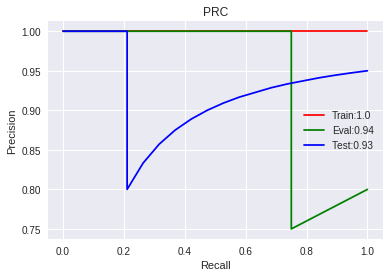

In [0]:
## PRC 
## PRC only valid for binary outcomes. 
## Editing levels < 0.5 are labeled as "0". 
## Editing levels >= 0.5 are labeled as "1". 

from sklearn.metrics import auc, precision_recall_curve

precision_train,recall_train,prc_thresholds_train=precision_recall_curve(train_y>=0.5,train_pred)
precision_eval,recall_eval,prc_thresholds_eval=precision_recall_curve(eval_y>=0.5,eval_pred)
precision_test,recall_test,prc_thresholds_test=precision_recall_curve(test_y>=0.5,test_pred)

auprc_train=auc(recall_train,precision_train)
auprc_eval=auc(recall_eval,precision_eval)
auprc_test=auc(recall_test,precision_test)

plt.plot(recall_train,precision_train,'r',label="Train:"+str(round(auprc_train,2)))
plt.plot(recall_eval,precision_eval,'g',label="Eval:"+str(round(auprc_eval,2)))
plt.plot(recall_test,precision_test,'b',label="Test:"+str(round(auprc_test,2)))
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("PRC")
plt.legend()

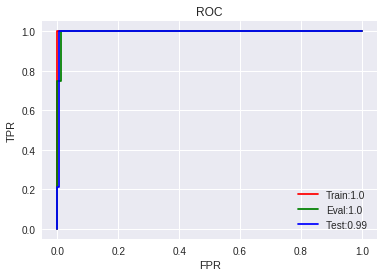

In [0]:
## ROC
from sklearn.metrics import roc_curve, roc_auc_score
fpr_train,tpr_train,roc_thresholds_train=roc_curve(train_y>=0.5,train_pred)
fpr_eval,tpr_eval,roc_thresholds_eval=roc_curve(eval_y>=0.5,eval_pred)
fpr_test,tpr_test,roc_thresholds_test=roc_curve(test_y>=0.5,test_pred)

auroc_train=roc_auc_score(train_y>=0.5,train_pred)
auroc_eval=roc_auc_score(eval_y>=0.5,eval_pred)
auroc_test=roc_auc_score(test_y>=0.5,test_pred)

plt.plot(fpr_train,tpr_train,'r',label="Train:"+str(round(auroc_train,2)))
plt.plot(fpr_eval,tpr_eval,'g',label="Eval:"+str(round(auroc_eval,2)))
plt.plot(fpr_test,tpr_test,'b',label="Test:"+str(round(auroc_test,2)))
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC")
plt.legend()

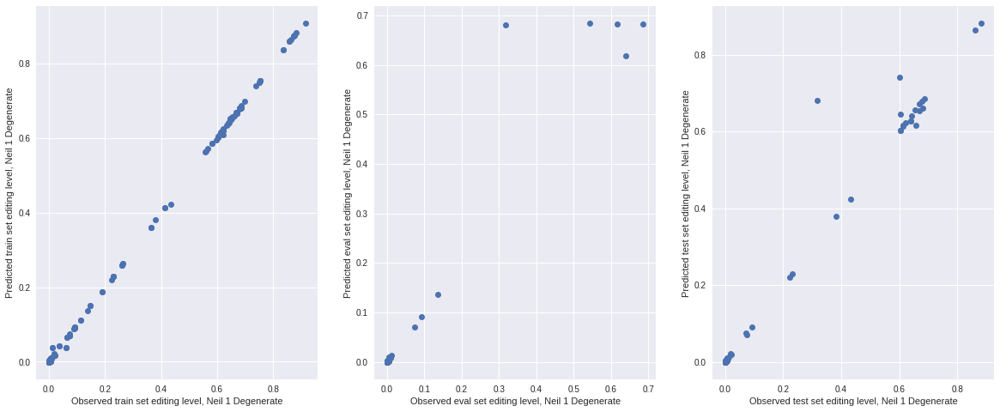

In [0]:
#plot the test set predictions 
matplotlib.rcParams['figure.figsize'] = [20, 8]
plt.subplot(1,3,1)
plt.plot(list(train_y),list(train_pred),'o')
plt.xlabel("Observed train set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted train set editing level, Neil 1 Degenerate")
plt.subplot(1,3,2)
plt.plot(list(eval_y),list(eval_pred),'o')
plt.xlabel("Observed eval set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted eval set editing level, Neil 1 Degenerate")
plt.subplot(1,3,3)
plt.plot(list(test_y),list(test_pred),'o')
plt.xlabel("Observed test set editing level, Neil 1 Degenerate")
plt.ylabel("Predicted test set editing level, Neil 1 Degenerate")

plt.show()

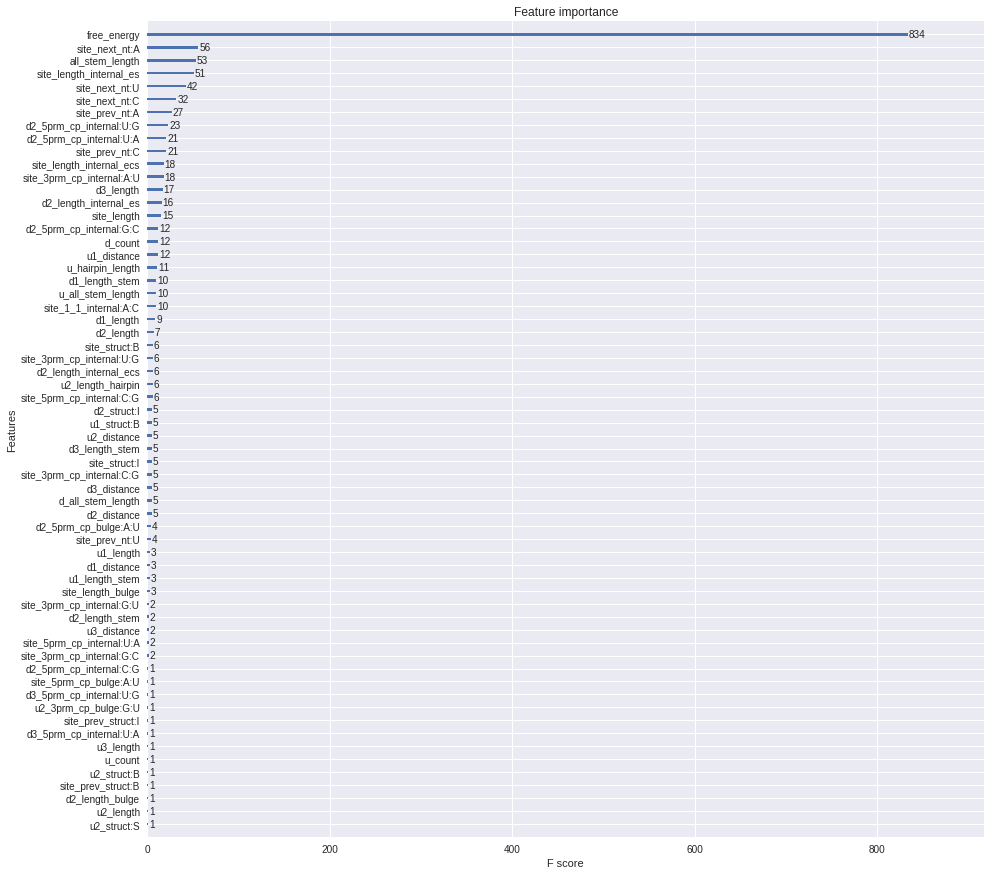

In [0]:
matplotlib.rcParams['figure.figsize'] = [15, 15]
xgboost.plot_importance(bst)

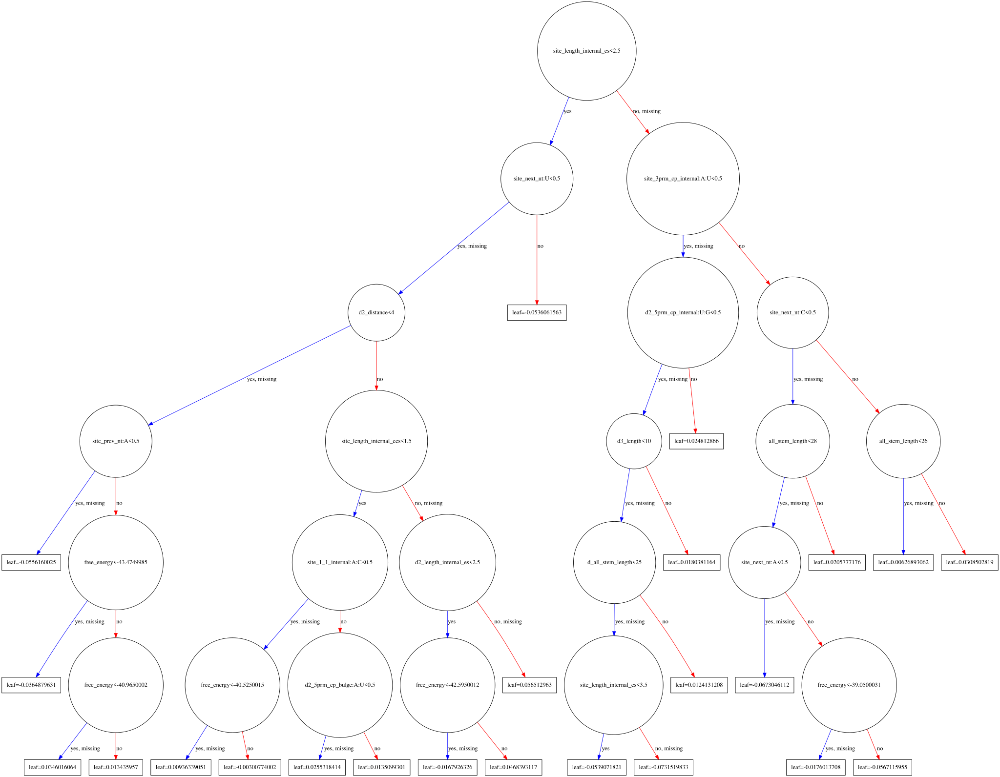

In [0]:
xgboost.to_graphviz(bst, num_trees=2)


In [0]:
# explain the model's predictions using SHAP values
explainer = shap.TreeExplainer(bst)
shap_values = explainer.shap_values(test_X)
shap_values.shape

(167, 139)

In [0]:
test_y=pd.DataFrame(test_y)
max_index=test_y.index[test_y['editing_value'] == max(test_y['editing_value'])]
max_row=test_y.index.get_loc(max_index[0])
# visualize prediction for isoform with the highest editing level 
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[max_row,:], test_X.iloc[max_row,:])

In [0]:
# visualize prediction for isoform with the lowest editing level 
shap.initjs()
min_index=test_y.index[test_y['editing_value'] == min(test_y['editing_value'])]
min_row=test_y.index.get_loc(min_index[0])
shap.force_plot(explainer.expected_value, shap_values[min_row,:], test_X.iloc[min_row,:])

In [0]:
# visualize the training set predictions
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values,train_X)

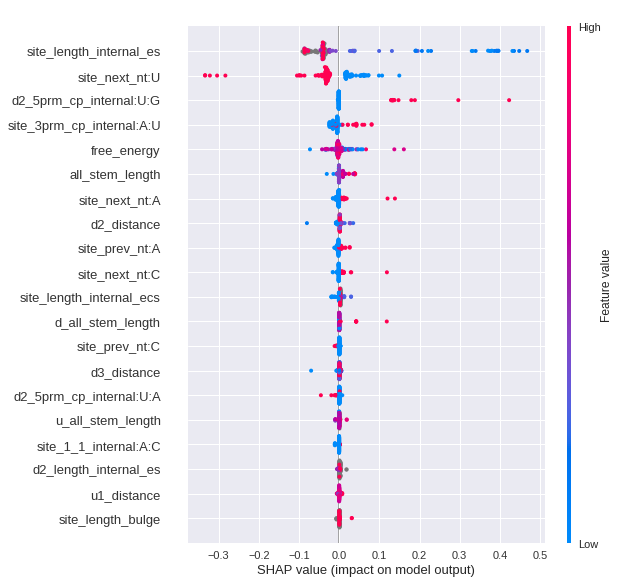

In [0]:
# summarize the effect of all the features 
shap.summary_plot(shap_values, test_X)


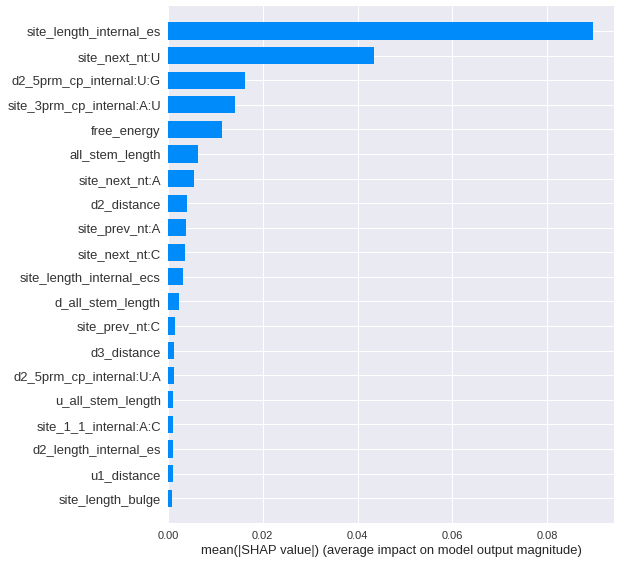

In [0]:
# We can also just take the mean absolute value of the SHAP values for each feature 
# to get a standard bar plot (produces stacked bars for multi-class outputs):
shap.summary_plot(shap_values, test_X, plot_type="bar")

In [0]:
## Compute pairwise interaction values from TreeShap
shap_interaction_values=explainer.shap_interaction_values(test_X)
shap_interaction_values.shape

(167, 139, 139)

In [0]:
##Average interaction values across the datapoints in the test set 
mean_interaction_values=np.mean(shap_interaction_values,axis=0)

In [0]:
Index=test_X.columns
Cols=test_X.columns
mean_interaction_values_df = pd.DataFrame(mean_interaction_values, index=Index, columns=Cols)

In [0]:
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
configure_plotly_browser_state()

trace = Heatmap(z=mean_interaction_values_df.values,
                   x=Cols,
                   y=Index)
iplot([trace],show_link=False)
